## 🏆 HPO 최적화 결과 요약

### 📊 최종 우승자: TPE Sampler

두 지표 모두 **TPE (Tree-structured Parzen Estimator)**가 **QMC (Quasi-Monte Carlo)**보다 우수한 성능을 보였습니다.

---

### 🔬 TPC 기반 라벨링 최적화

| **항목**         | **최적값**         | **비고**                       |
|------------------|--------------------|--------------------------------|
| **Best Score**   | `275.963`          | TPE가 QMC 대비 4.815 우수      |
| **Best TPC Low** | `4.369`            | 신선 임계값 (Fresh < 4.369)    |
| **Best TPC High**| `6.427`            | 부패 임계값 (Decay ≥ 6.427)    |

#### 📈 최종 라벨 분포 (TPC)
- **Fresh (신선)**: 154개 (57.0%)
- **Decay (부패)**: 35개 (13.0%)
- **Middle (중간)**: 81개 (30.0%)

---

### 🧪 TBARS 기반 라벨링 최적화

| **Metric**        | **TPE**    | **QMC**    |
|-------------------|------------|------------|
| Best Score        | 300.000    | 300.000    |
| Mean Score        | 270.031    | 117.692    |
| Std Score         | 70.069     | 80.349     |
| Best TBARS Low    | 0.187      | 0.187      |
| Best TBARS High   | 0.301      | 0.298      |
| Runtime (s)       | ~500 trials| 1.4        |

🏆 **최종 승자:** TPE  
**성능 향상:** 0.000

#### 📈 최종 라벨 분포 (TBARS)
- **Fresh (신선)**: 39개 (14.4%)
- **Decay (부패)**: 96개 (35.6%)
- **Middle (중간)**: 135개 (50.0%)

---

### 📋 메모용 요약표

| **지표** | **Best Score** | **Low Threshold** | **High Threshold** |
|----------|---------------|-------------------|-------------------|
| **TPC**  | 275.963       | 4.369             | 6.427             |
| **TBARS**| 300.000       | 0.187             | 0.298             |

---

> **결론:** TPE가 TPC 기준에서 QMC 대비 더 우수한 성능을 보였으며, TBARS 기준에서는 두 방법 모두 동일한 최고 점수를 기록했습니다.

## .pkl 파일 불러오기

In [9]:
import pickle
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from IPython.display import display
import os

# 전처리된 데이터 불러오기
save_dir = "/Users/taehokim/lab/BRL_AI/BRL_final/CLR_pkl" 

print("=== 전처리된 데이터 불러오기 ===")

# 1. 최종 데이터만 불러오기 (final_taxonomic_levels)
all_data_path = os.path.join(save_dir, "all_preprocessed_data.pkl")

if os.path.exists(all_data_path):
    with open(all_data_path, 'rb') as f:
        preprocessed_data = pickle.load(f)
    final_taxonomic_levels = preprocessed_data['final_taxonomic_levels']
    print(f"✅ 최종 데이터 로드 완료")
    print(f"총 taxonomy level 수: {len(final_taxonomic_levels)}")
else:
    print(f"❌ 통합 데이터 파일을 찾을 수 없습니다: {all_data_path}")

# 2. ANOVA 결과 불러오기
anova_results_path = os.path.join(save_dir, "anova_results.pkl")
if os.path.exists(anova_results_path):
    with open(anova_results_path, 'rb') as f:
        anova_results = pickle.load(f)
    print(f"✅ ANOVA 결과 로드 완료")
else:
    print(f"❌ ANOVA 결과 파일을 찾을 수 없습니다: {anova_results_path}")

# 3. 변화량 분석 결과 불러오기
change_analysis_path = os.path.join(save_dir, "change_analysis_results.pkl")
if os.path.exists(change_analysis_path):
    with open(change_analysis_path, 'rb') as f:
        change_analysis_results = pickle.load(f)
    print(f"✅ 변화량 분석 결과 로드 완료")
else:
    print(f"❌ 변화량 분석 결과 파일을 찾을 수 없습니다: {change_analysis_path}")

# 4. ANOVA 결과 검토 (상위 5개 feature만 표시)
print(f"\n=== ANOVA 결과 검토 (상위 5개 유의 Feature) ===")
for level_name in ['Phylum', 'Class', 'Order', 'Family', 'Genus']:
    if level_name in anova_results:
        anova_result_df = anova_results[level_name]['anova_result']
        significant_features = anova_results[level_name]['significant_features']
        print(f"\n[{level_name}]")
        print(f"총 유의 Feature 수: {len(significant_features)}")
        if not anova_result_df.empty:
            top_5_anova = anova_result_df.head(5)
            print(f"상위 5개 유의 Feature (p-value 기준):")
            display(top_5_anova)
        else:
            print("ANOVA 결과가 없습니다.")

# 5. 변화량 분석 결과 검토 (상위 5개만 표시)
print(f"\n=== 변화량 분석 결과 검토 (상위 5개 변화량) ===")
for level_name in ['Phylum', 'Class', 'Order', 'Family', 'Genus']:
    if level_name in change_analysis_results:
        top_features = change_analysis_results[level_name]['top_10_features'][:5]
        summary_stats = change_analysis_results[level_name]['summary_stats']
        print(f"\n[{level_name}]")
        print(f"증가 패턴: {summary_stats['increase_count']}개, 감소 패턴: {summary_stats['decrease_count']}개")
        if top_features:
            change_df = pd.DataFrame([
                {
                    'Feature': feat['feature'],
                    'Change_Amount': feat['change_amount'],
                    'Abs_Change': feat['abs_change'],
                    'Trend': feat['trend'],
                    'Min_Day': feat['min_day'],
                    'Max_Day': feat['max_day']
                }
                for feat in top_features
            ])
            print(f"상위 5개 변화량 Feature:")
            display(change_df)
        else:
            print("변화량 분석 결과가 없습니다.")

# 6. 데이터 구조 간단 확인
print(f"\n=== 데이터 구조 요약 ===")
for level_name, merged_df in final_taxonomic_levels:
    feature_cols = [col for col in merged_df.columns if col not in ['Description', 'TPC (log CFU/g)', 'TBARS']]
    significant_features = anova_results[level_name]['significant_features']
    print(f"[{level_name}] 샘플: {len(merged_df)}, 전체 Feature: {len(feature_cols)}, ANOVA 유의: {len(significant_features)}")

# 7. 특정 레벨 선택 함수 (HPO에서 사용할 수 있도록)
def get_level_data(level_name):
    """특정 taxonomy level의 데이터를 반환하는 함수"""
    for name, data in final_taxonomic_levels:
        if name.lower() == level_name.lower():
            feature_cols = [col for col in data.columns if col not in ['Description', 'TPC (log CFU/g)', 'TBARS']]
            return {
                'data': data,
                'features': data[feature_cols],
                'feature_names': feature_cols,
                'tpc': data['TPC (log CFU/g)'],
                'tbars': data['TBARS'],
                'description': data['Description'],
                'significant_features': anova_results[name]['significant_features'],
                'anova_results': anova_results[name],
                'change_analysis': change_analysis_results[name]
            }
    return None

print(f"\n=== 데이터 로딩 완료 ===")
print("이제 하이퍼파라미터 최적화를 진행할 수 있습니다.")

# 8. 사용 예시
print(f"\n=== 사용 예시 ===")
print("# 특정 레벨 데이터 가져오기:")
print("genus_data = get_level_data('genus')")
print("X = genus_data['features']  # Feature 데이터")
print("y_tpc = genus_data['tpc']   # TPC 타겟")
print("y_tbars = genus_data['tbars']  # TBARS 타겟")
print("significant_features = genus_data['significant_features']  # ANOVA 유의 Feature")
print("top_change_features = genus_data['change_analysis']['top_10_features']  # 변화량 상위 Feature")

=== 전처리된 데이터 불러오기 ===
✅ 최종 데이터 로드 완료
총 taxonomy level 수: 5
✅ ANOVA 결과 로드 완료
✅ 변화량 분석 결과 로드 완료

=== ANOVA 결과 검토 (상위 5개 유의 Feature) ===

[Phylum]
총 유의 Feature 수: 12
상위 5개 유의 Feature (p-value 기준):


,feature,f_statistic,p_value,fdr
6,p__Deinococcota,34.734869,4.434908e-37,5.321890e-36
2,p__Bacteroidota,32.394400,4.045796e-35,2.427478e-34
4,p__Proteobacteria,14.010545,6.247631e-17,2.499053e-16
3,p__Chloroflexi,10.326593,1.505222e-12,4.515667e-12
11,p__Acidobacteriota,10.256684,1.834053e-12,4.401728e-12



[Class]
총 유의 Feature 수: 13
상위 5개 유의 Feature (p-value 기준):


,feature,f_statistic,p_value,fdr
5,c__Alphaproteobacteria,39.072509,1.516817e-40,1.971863e-39
6,c__Deinococci,35.573071,9.135277e-38,5.937930e-37
2,c__Bacteroidia,35.004501,2.662388e-37,1.153701e-36
4,c__Gammaproteobacteria,17.011379,2.684438e-20,8.724422e-20
10,c__Negativicutes,12.885207,1.273132e-15,3.310143e-15



[Order]
총 유의 Feature 수: 48
상위 5개 유의 Feature (p-value 기준):


,feature,f_statistic,p_value,fdr
15,o__Bacillales,85.996188,1.031225e-68,4.949881e-67
8,o__Xanthomonadales,72.490273,6.305695e-62,1.513367e-60
3,o__Pseudomonadales,67.223805,4.807589e-59,7.692142e-58
27,o__Aeromonadales,48.856314,1.132304e-47,1.358764e-46
33,o__Staphylococcales,46.239771,7.498659e-46,7.198712e-45



[Family]
총 유의 Feature 수: 85
상위 5개 유의 Feature (p-value 기준):


,feature,f_statistic,p_value,fdr
54,f__Chitinibacteraceae,353.478640,2.678236e-135,2.276500e-133
56,f__Listeriaceae,168.446767,1.953223e-98,8.301199e-97
20,f__Bacillaceae,88.560876,6.476680e-70,1.835059e-68
11,f__Xanthomonadaceae,75.054579,2.801932e-63,5.954105e-62
27,f__Vagococcaceae,74.323288,6.758308e-63,1.148912e-61



[Genus]
총 유의 Feature 수: 133
상위 5개 유의 Feature (p-value 기준):


,feature,f_statistic,p_value,fdr
60,g__Iodobacter,358.981444,4.241106e-136,5.640671e-134
64,g__Brochothrix,195.211125,1.727308e-105,1.148660e-103
21,g__Bacillus,93.371949,4.196296e-72,1.860358e-70
92,g__Macrococcus,81.113778,2.367538e-66,7.872064e-65
95,g__Streptococcus,77.131501,2.372840e-64,6.311754e-63



=== 변화량 분석 결과 검토 (상위 5개 변화량) ===

[Phylum]
증가 패턴: 12개, 감소 패턴: 0개
상위 5개 변화량 Feature:


,Feature,Change_Amount,Abs_Change,Trend,Min_Day,Max_Day
0,p__Deinococcota,11.296755,11.296755,감소 후 증가,14,3
1,p__Bacteroidota,5.583479,5.583479,감소 후 증가,18,7
2,p__Campilobacterota,3.938875,3.938875,증가,0,3
3,p__Actinobacteriota,1.181904,1.181904,증가,1,11
4,p__Proteobacteria,1.113002,1.113002,증가,3,14



[Class]
증가 패턴: 13개, 감소 패턴: 0개
상위 5개 변화량 Feature:


,Feature,Change_Amount,Abs_Change,Trend,Min_Day,Max_Day
0,c__Deinococci,11.635344,11.635344,감소 후 증가,14,3
1,c__Alphaproteobacteria,6.992750,6.992750,감소 후 증가,11,1
2,c__Clostridia,5.837143,5.837143,감소 후 증가,9,0
3,c__Bacteroidia,5.782637,5.782637,감소 후 증가,18,7
4,c__Negativicutes,4.435462,4.435462,감소 후 증가,5,0



[Order]
증가 패턴: 48개, 감소 패턴: 0개
상위 5개 변화량 Feature:


,Feature,Change_Amount,Abs_Change,Trend,Min_Day,Max_Day
0,o__Bacillales,13.314147,13.314147,감소 후 증가,18,3
1,o__Xanthomonadales,13.142663,13.142663,감소 후 증가,18,3
2,o__Aeromonadales,12.550232,12.550232,감소 후 증가,9,3
3,o__Staphylococcales,11.204740,11.204740,감소 후 증가,18,1
4,o__Thermales,11.022691,11.022691,감소 후 증가,14,3



[Family]
증가 패턴: 85개, 감소 패턴: 0개
상위 5개 변화량 Feature:


,Feature,Change_Amount,Abs_Change,Trend,Min_Day,Max_Day
0,f__Chitinibacteraceae,14.204433,14.204433,증가,3,18
1,f__Bacillaceae,13.781898,13.781898,감소 후 증가,18,3
2,f__Xanthomonadaceae,13.613548,13.613548,감소 후 증가,18,3
3,f__Vagococcaceae,13.444156,13.444156,증가,5,18
4,f__Carnobacteriaceae,13.438775,13.438775,증가,0,18



[Genus]
증가 패턴: 133개, 감소 패턴: 0개
상위 5개 변화량 Feature:


,Feature,Change_Amount,Abs_Change,Trend,Min_Day,Max_Day
0,g__Macrococcus,14.233680,14.233680,감소 후 증가,18,3
1,g__Iodobacter,14.092941,14.092941,증가,3,18
2,g__Bacillus,14.003815,14.003815,감소 후 증가,18,3
3,g__Xanthomonas,13.752768,13.752768,감소 후 증가,18,3
4,g__Streptococcus,13.549499,13.549499,감소 후 증가,18,3



=== 데이터 구조 요약 ===
[Phylum] 샘플: 270, 전체 Feature: 12, ANOVA 유의: 12
[Class] 샘플: 270, 전체 Feature: 13, ANOVA 유의: 13
[Order] 샘플: 270, 전체 Feature: 48, ANOVA 유의: 48
[Family] 샘플: 270, 전체 Feature: 85, ANOVA 유의: 85
[Genus] 샘플: 270, 전체 Feature: 133, ANOVA 유의: 133

=== 데이터 로딩 완료 ===
이제 하이퍼파라미터 최적화를 진행할 수 있습니다.

=== 사용 예시 ===
# 특정 레벨 데이터 가져오기:
genus_data = get_level_data('genus')
X = genus_data['features']  # Feature 데이터
y_tpc = genus_data['tpc']   # TPC 타겟
y_tbars = genus_data['tbars']  # TBARS 타겟
significant_features = genus_data['significant_features']  # ANOVA 유의 Feature
top_change_features = genus_data['change_analysis']['top_10_features']  # 변화량 상위 Feature


In [10]:
# 각 taxonomy level별 상세 feature 정보 확인
print("=== Taxonomy Level별 Feature 상세 정보 ===")

feature_summary = []

for level_name, merged_df in final_taxonomic_levels:
    feature_cols = [col for col in merged_df.columns if col not in ['Description', 'TPC (log CFU/g)', 'TBARS']]
    significant_features = anova_results[level_name]['significant_features']
    
    # 각 레벨별 정보 수집
    level_info = {
        'Level': level_name,
        'Total_Features': len(feature_cols),
        'ANOVA_Significant': len(significant_features),
        'Sample_Count': len(merged_df),
        'Significant_Ratio': f"{len(significant_features)/len(feature_cols)*100:.1f}%" if feature_cols else "0%"
    }
    feature_summary.append(level_info)
    
    print(f"\n[{level_name}]")
    print(f"  전체 Feature 수: {len(feature_cols)}")
    print(f"  ANOVA 유의 Feature 수: {len(significant_features)}")
    print(f"  유의 Feature 비율: {len(significant_features)/len(feature_cols)*100:.1f}%")
    print(f"  총 샘플 수: {len(merged_df)}")
    
    # Feature 이름 예시 (처음 5개)
    print(f"  Feature 예시 (처음 5개): {feature_cols[:5]}")
    
    # ANOVA 유의 Feature 예시 (처음 5개)
    if significant_features:
        print(f"  유의 Feature 예시 (처음 5개): {significant_features[:5]}")
    else:
        print(f"  유의한 Feature 없음")
    
    # Feature 명명 규칙 확인 (prefix 확인)
    if feature_cols:
        prefixes = set([col.split('__')[0] + '__' for col in feature_cols if '__' in col])
        print(f"  Feature prefix: {list(prefixes)}")

# Summary Table 생성
summary_df = pd.DataFrame(feature_summary)
print(f"\n=== Feature 수 요약 테이블 ===")
print(summary_df.to_string(index=False))

# 시각적 요약
print(f"\n=== 레벨별 Feature 수 비교 ===")
for info in feature_summary:
    level = info['Level']
    total = info['Total_Features']
    significant = info['ANOVA_Significant']
    bar_length = 50
    
    # 막대그래프 스타일로 표시
    total_bar = '█' * min(int(total/10), bar_length)
    sig_bar = '▓' * min(int(significant/10), bar_length)
    
    print(f"{level:8} │ 전체: {total:4d} {total_bar}")
    print(f"         │ 유의: {significant:4d} {sig_bar}")
    print(f"         │ 비율: {info['Significant_Ratio']:>6}")
    print("─" * 60)

# 전체 통계
total_all_features = sum([info['Total_Features'] for info in feature_summary])
total_significant_features = sum([info['ANOVA_Significant'] for info in feature_summary])

print(f"\n=== 전체 통계 ===")
print(f"모든 레벨 전체 Feature 합계: {total_all_features}")
print(f"모든 레벨 유의 Feature 합계: {total_significant_features}")
print(f"전체 유의 Feature 비율: {total_significant_features/total_all_features*100:.1f}%")

# 레벨별 Feature 밀도 (Feature 수 / 샘플 수)
print(f"\n=== Feature 밀도 (Feature 수 / 샘플 수) ===")
for info in feature_summary:
    density = info['Total_Features'] / info['Sample_Count']
    sig_density = info['ANOVA_Significant'] / info['Sample_Count']
    print(f"{info['Level']:8} │ 전체: {density:.2f} │ 유의: {sig_density:.2f}")

=== Taxonomy Level별 Feature 상세 정보 ===

[Phylum]
  전체 Feature 수: 12
  ANOVA 유의 Feature 수: 12
  유의 Feature 비율: 100.0%
  총 샘플 수: 270
  Feature 예시 (처음 5개): ['p__Firmicutes', 'p__Actinobacteriota', 'p__Bacteroidota', 'p__Chloroflexi', 'p__Proteobacteria']
  유의 Feature 예시 (처음 5개): ['p__Deinococcota', 'p__Bacteroidota', 'p__Proteobacteria', 'p__Chloroflexi', 'p__Acidobacteriota']
  Feature prefix: ['p__']

[Class]
  전체 Feature 수: 13
  ANOVA 유의 Feature 수: 13
  유의 Feature 비율: 100.0%
  총 샘플 수: 270
  Feature 예시 (처음 5개): ['c__Bacilli', 'c__Actinobacteria', 'c__Bacteroidia', 'c__Chloroflexia', 'c__Gammaproteobacteria']
  유의 Feature 예시 (처음 5개): ['c__Alphaproteobacteria', 'c__Deinococci', 'c__Bacteroidia', 'c__Gammaproteobacteria', 'c__Negativicutes']
  Feature prefix: ['c__']

[Order]
  전체 Feature 수: 48
  ANOVA 유의 Feature 수: 48
  유의 Feature 비율: 100.0%
  총 샘플 수: 270
  Feature 예시 (처음 5개): ['o__Lactobacillales', 'o__Corynebacteriales', 'o__Flavobacteriales', 'o__Pseudomonadales', 'o__Bacilli(c)']
  유의 

## HPO 분석 전 dataset 구분 

In [11]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

print("=== HPO 분석을 위한 데이터셋 구분 ===")

# 각 taxonomy level별로 TPC와 TBARS 데이터셋을 별도로 생성
tpc_datasets = {}
tbars_datasets = {}

for level_name, merged_df in final_taxonomic_levels:
    # Feature 컬럼들 (Description, TPC, TBARS 제외)
    feature_cols = [col for col in merged_df.columns if col not in ['Description', 'TPC (log CFU/g)', 'TBARS']]
    
    # 1. TPC 데이터셋 생성 (Features + TPC)
    tpc_df = merged_df[['Description'] + feature_cols + ['TPC (log CFU/g)']].copy()
    tpc_datasets[level_name] = {
        'data': tpc_df,
        'features': tpc_df[feature_cols],
        'target': tpc_df['TPC (log CFU/g)'],
        'feature_names': feature_cols,
        'target_name': 'TPC (log CFU/g)',
        'description': tpc_df['Description'],
        'significant_features': anova_results[level_name]['significant_features']
    }
    
    # 2. TBARS 데이터셋 생성 (Features + TBARS)
    tbars_df = merged_df[['Description'] + feature_cols + ['TBARS']].copy()
    tbars_datasets[level_name] = {
        'data': tbars_df,
        'features': tbars_df[feature_cols],
        'target': tbars_df['TBARS'],
        'feature_names': feature_cols,
        'target_name': 'TBARS',
        'description': tbars_df['Description'],
        'significant_features': anova_results[level_name]['significant_features']
    }
    
    print(f"\n[{level_name}]")
    print(f"  Feature 수: {len(feature_cols)}")
    print(f"  샘플 수: {len(merged_df)}")
    print(f"  TPC 범위: {tpc_df['TPC (log CFU/g)'].min():.2f} ~ {tpc_df['TPC (log CFU/g)'].max():.2f}")
    print(f"  TBARS 범위: {tbars_df['TBARS'].min():.2f} ~ {tbars_df['TBARS'].max():.2f}")
    print(f"  ANOVA 유의 Feature 수: {len(anova_results[level_name]['significant_features'])}")

# 데이터셋 접근 함수들
def get_tpc_dataset(level_name):
    """특정 taxonomy level의 TPC 데이터셋을 반환"""
    if level_name in tpc_datasets:
        return tpc_datasets[level_name]
    else:
        print(f"Level '{level_name}' not found. Available levels: {list(tpc_datasets.keys())}")
        return None

def get_tbars_dataset(level_name):
    """특정 taxonomy level의 TBARS 데이터셋을 반환"""
    if level_name in tbars_datasets:
        return tbars_datasets[level_name]
    else:
        print(f"Level '{level_name}' not found. Available levels: {list(tbars_datasets.keys())}")
        return None

def get_dataset_summary():
    """전체 데이터셋 요약 정보 출력"""
    print("\n=== 데이터셋 요약 ===")
    print(f"{'Level':<10} {'Samples':<8} {'Features':<10} {'ANOVA Sig':<12} {'TPC Range':<15} {'TBARS Range':<15}")
    print("-" * 80)
    
    for level_name in tpc_datasets.keys():
        tpc_data = tpc_datasets[level_name]
        tbars_data = tbars_datasets[level_name]
        
        sample_count = len(tpc_data['data'])
        feature_count = len(tpc_data['feature_names'])
        sig_count = len(tpc_data['significant_features'])
        
        tpc_min, tpc_max = tpc_data['target'].min(), tpc_data['target'].max()
        tbars_min, tbars_max = tbars_data['target'].min(), tbars_data['target'].max()
        
        print(f"{level_name:<10} {sample_count:<8} {feature_count:<10} {sig_count:<12} "
              f"{tpc_min:.1f}-{tpc_max:.1f}{'':>6} {tbars_min:.1f}-{tbars_max:.1f}")

# 요약 정보 출력
get_dataset_summary()


=== HPO 분석을 위한 데이터셋 구분 ===

[Phylum]
  Feature 수: 12
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 12

[Class]
  Feature 수: 13
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 13

[Order]
  Feature 수: 48
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 48

[Family]
  Feature 수: 85
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 85

[Genus]
  Feature 수: 133
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 133

=== 데이터셋 요약 ===
Level      Samples  Features   ANOVA Sig    TPC Range       TBARS Range    
--------------------------------------------------------------------------------
Phylum     270      12         12           2.1-8.6       0.1-0.6
Class      270      13         13           2.1-8.6       0.1-0.6
Order      270      48         48           2.1-8.6       0.1-0.6
Family     270      85         85           2.1-8.6      

In [12]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

print("=== HPO 분석을 위한 데이터셋 구분 ===")

# 각 taxonomy level별로 TPC와 TBARS 데이터셋을 별도로 생성 (Description 제거)
tpc_datasets = {}
tbars_datasets = {}

for level_name, merged_df in final_taxonomic_levels:
    # Feature 컬럼들 (Description, TPC, TBARS 제외)
    feature_cols = [col for col in merged_df.columns if col not in ['Description', 'TPC (log CFU/g)', 'TBARS']]
    
    # 1. TPC 데이터셋 생성 (Features + TPC, Description 제거)
    tpc_df = merged_df[feature_cols + ['TPC (log CFU/g)']].copy()
    # TPC를 첫 번째 열로 이동
    tpc_df = tpc_df[['TPC (log CFU/g)'] + feature_cols]
    
    tpc_datasets[level_name] = {
        'data': tpc_df,
        'features': tpc_df[feature_cols],
        'target': tpc_df['TPC (log CFU/g)'],
        'feature_names': feature_cols,
        'target_name': 'TPC (log CFU/g)',
        'significant_features': anova_results[level_name]['significant_features']
    }
    
    # 2. TBARS 데이터셋 생성 (Features + TBARS, Description 제거)
    tbars_df = merged_df[feature_cols + ['TBARS']].copy()
    # TBARS를 첫 번째 열로 이동
    tbars_df = tbars_df[['TBARS'] + feature_cols]
    
    tbars_datasets[level_name] = {
        'data': tbars_df,
        'features': tbars_df[feature_cols],
        'target': tbars_df['TBARS'],
        'feature_names': feature_cols,
        'target_name': 'TBARS',
        'significant_features': anova_results[level_name]['significant_features']
    }
    
    print(f"\n[{level_name}]")
    print(f"  Feature 수: {len(feature_cols)}")
    print(f"  샘플 수: {len(merged_df)}")
    print(f"  TPC 범위: {tpc_df['TPC (log CFU/g)'].min():.2f} ~ {tpc_df['TPC (log CFU/g)'].max():.2f}")
    print(f"  TBARS 범위: {tbars_df['TBARS'].min():.2f} ~ {tbars_df['TBARS'].max():.2f}")
    print(f"  ANOVA 유의 Feature 수: {len(anova_results[level_name]['significant_features'])}")

# 데이터셋 접근 함수들
def get_tpc_dataset(level_name):
    """특정 taxonomy level의 TPC 데이터셋을 반환"""
    if level_name in tpc_datasets:
        return tpc_datasets[level_name]
    else:
        print(f"Level '{level_name}' not found. Available levels: {list(tpc_datasets.keys())}")
        return None

def get_tbars_dataset(level_name):
    """특정 taxonomy level의 TBARS 데이터셋을 반환"""
    if level_name in tbars_datasets:
        return tbars_datasets[level_name]
    else:
        print(f"Level '{level_name}' not found. Available levels: {list(tbars_datasets.keys())}")
        return None

def get_dataset_summary():
    """전체 데이터셋 요약 정보 출력"""
    print("\n=== 데이터셋 요약 ===")
    print(f"{'Level':<10} {'Samples':<8} {'Features':<10} {'ANOVA Sig':<12} {'TPC Range':<15} {'TBARS Range':<15}")
    print("-" * 80)
    
    for level_name in tpc_datasets.keys():
        tpc_data = tpc_datasets[level_name]
        tbars_data = tbars_datasets[level_name]
        
        sample_count = len(tpc_data['data'])
        feature_count = len(tpc_data['feature_names'])
        sig_count = len(tpc_data['significant_features'])
        
        tpc_min, tpc_max = tpc_data['target'].min(), tpc_data['target'].max()
        tbars_min, tbars_max = tbars_data['target'].min(), tbars_data['target'].max()
        
        print(f"{level_name:<10} {sample_count:<8} {feature_count:<10} {sig_count:<12} "
              f"{tpc_min:.1f}-{tpc_max:.1f}{'':>6} {tbars_min:.1f}-{tbars_max:.1f}")

# 요약 정보 출력
get_dataset_summary()

# 검토를 위해 데이터셋 구조 확인
print("\n=== TPC 및 TBARS 데이터셋 구조 검토 ===")

# TPC 데이터셋 확인
print("\n=== TPC 데이터셋 검토 ===")
for level_name in tpc_datasets.keys():
    tpc_data = tpc_datasets[level_name]
    print(f"\n[{level_name} - TPC 데이터셋]")
    display(tpc_data['data'].head(5))

print("\n" + "="*80)

# TBARS 데이터셋 확인
print("\n=== TBARS 데이터셋 검토 ===")
for level_name in tbars_datasets.keys():
    tbars_data = tbars_datasets[level_name]
    print(f"\n[{level_name} - TBARS 데이터셋]")
    display(tbars_data['data'].head(5))

print("\n=== 데이터셋 준비 완료 ===")
print("Description 컬럼이 제거되고 타겟 변수가 첫 번째 열로 배치된 최종 데이터셋")

=== HPO 분석을 위한 데이터셋 구분 ===

[Phylum]
  Feature 수: 12
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 12

[Class]
  Feature 수: 13
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 13

[Order]
  Feature 수: 48
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 48

[Family]
  Feature 수: 85
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 85

[Genus]
  Feature 수: 133
  샘플 수: 270
  TPC 범위: 2.06 ~ 8.55
  TBARS 범위: 0.10 ~ 0.55
  ANOVA 유의 Feature 수: 133

=== 데이터셋 요약 ===
Level      Samples  Features   ANOVA Sig    TPC Range       TBARS Range    
--------------------------------------------------------------------------------
Phylum     270      12         12           2.1-8.6       0.1-0.6
Class      270      13         13           2.1-8.6       0.1-0.6
Order      270      48         48           2.1-8.6       0.1-0.6
Family     270      85         85           2.1-8.6      

,TPC (log CFU/g),p__Firmicutes,p__Actinobacteriota,p__Bacteroidota,p__Chloroflexi,p__Proteobacteria,p__Cyanobacteria,p__Deinococcota,p__Bacteria(d),p__Bdellovibrionota,p__Campilobacterota,p__Planctomycetota,p__Acidobacteriota
0,3.681241,15.196176,12.845909,12.220203,-1.943324,16.094118,-1.943324,-1.943324,-1.943324,-1.943324,-1.943324,-1.943324,-1.943324
1,3.922395,15.702072,11.650287,11.198302,-2.292540,15.001785,-2.292540,10.638686,-2.292540,-2.292540,-2.292540,-2.292540,-2.292540
2,4.137584,15.706135,10.688193,10.331518,-2.196729,15.298351,-2.196729,9.484220,-2.196729,-2.196729,-2.196729,-2.196729,-2.196729
3,3.792392,15.616642,11.564443,12.471164,-1.916638,15.930267,-1.916638,-1.916638,-1.916638,-1.916638,-1.916638,-1.916638,-1.916638
4,3.462398,16.526635,13.301115,10.299594,-1.516184,15.657767,-1.516184,-1.516184,-1.516184,-1.516184,-1.516184,-1.516184,-1.516184



[Class - TPC 데이터셋]


,TPC (log CFU/g),c__Bacilli,c__Actinobacteria,c__Bacteroidia,c__Chloroflexia,c__Gammaproteobacteria,c__Alphaproteobacteria,c__Deinococci,c__Bacteria(d),c__Bdellovibrionia,c__Clostridia,c__Negativicutes,c__Campylobacteria,c__Planctomycetes
0,3.681241,15.703688,13.360095,12.734389,-1.429139,16.593745,12.371483,-1.429139,-1.429139,-1.429139,10.697507,-1.429139,-1.429139,-1.429139
1,3.922395,16.377865,12.328454,11.876469,-1.614374,15.636006,12.533248,11.316853,-1.614374,-1.614374,10.336024,-1.614374,-1.614374,-1.614374
2,4.137584,16.538631,11.520689,11.164014,-1.364233,16.112774,12.108476,10.316716,-1.364233,-1.364233,-1.364233,-1.364233,-1.364233,-1.364233
3,3.792392,15.864001,11.837800,12.744521,-1.643282,16.176024,12.599940,-1.643282,-1.643282,-1.643282,11.928771,10.872719,-1.643282,-1.643282
4,3.462398,17.034188,13.808667,11.263140,-1.008631,16.138652,12.527734,-1.008631,-1.008631,-1.008631,-1.008631,-1.008631,-1.008631,-1.008631



[Order - TPC 데이터셋]


,TPC (log CFU/g),o__Lactobacillales,o__Corynebacteriales,o__Flavobacteriales,o__Pseudomonadales,o__Bacilli(c),o__Bacteroidales,o__Rhizobiales,o__Oceanospirillales,o__Xanthomonadales,...,o__Campylobacterales,o__Pasteurellales,o__Alphaproteobacteria(c),o__Acidaminococcales,o__Cellvibrionales,o__Thermoactinomycetales,o__Streptosporangiales,o__Gammaproteobacteria_Incertae_Sedis,o__Reyranellales,o__Caedibacterales
0,3.681241,15.331948,7.425228,11.756798,15.467928,-1.573821,-1.573821,7.482961,-1.573821,11.852108,...,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821
1,3.922395,16.149818,10.757100,11.786719,14.940676,-1.704123,-1.704123,12.325716,-1.704123,12.931852,...,-1.704123,-1.704123,-1.704123,-1.704123,-1.704123,-1.704123,-1.704123,-0.587669,-1.704123,-1.704123
2,4.137584,16.165883,7.425228,10.398623,15.069530,-1.606377,10.921871,11.055402,10.585398,13.540309,...,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377
3,3.792392,15.166755,11.097225,11.308534,14.889404,-2.172547,11.154384,11.154384,-2.172547,12.483520,...,-2.172547,-1.052512,-2.172547,-2.172547,-2.172547,-2.172547,-2.172547,-2.172547,-2.172547,-2.172547
4,3.462398,16.886984,7.425228,10.398623,15.469918,-1.021357,-1.021357,7.482961,-1.021357,10.625773,...,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357



[Family - TPC 데이터셋]


,TPC (log CFU/g),f__Leuconostocaceae,f__Corynebacteriaceae,f__Streptococcaceae,f__Weeksellaceae,f__Moraxellaceae,f__Lactobacillaceae,f__Bacilli(c),f__Pseudomonadaceae,f__Beijerinckiaceae,...,f__Selenomonadaceae,f__Aerococcaceae,f__Cellulomonadaceae,f__Sphingobacteriales_env.OPS_17,f__Crocinitomicaceae,f__Gammaproteobacteria_Incertae_Sedis_Unknown_Family,f__Reyranellaceae,f__Xanthobacteraceae,f__Hafniaceae,f__Caedibacteraceae
0,3.681241,13.686602,-1.233251,15.347742,12.097367,14.623096,11.586542,-1.233251,15.443756,-1.233251,...,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251
1,3.922395,14.480066,11.001907,16.188175,10.491082,13.835120,11.471911,-1.459316,14.885531,11.001907,...,-1.459316,-1.459316,-1.459316,-1.459316,-1.234129,-0.497137,-1.459316,12.165058,-1.459316,-1.459316
2,4.137584,14.213649,-1.273963,16.361960,10.546857,14.271219,10.930723,-1.273963,15.012157,11.387816,...,-1.273963,-0.819699,-1.273963,-1.273963,-1.273963,-1.273963,-1.273963,-1.273963,-1.273963,-1.273963
3,3.792392,13.966111,11.294618,15.308920,10.521428,13.829535,11.502257,-1.706890,15.109791,11.620041,...,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890
4,3.462398,14.185991,-0.794564,15.551203,10.546857,14.223405,10.930723,-0.794564,15.436428,-0.794564,...,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564



[Genus - TPC 데이터셋]


,TPC (log CFU/g),g__Leuconostoc,g__Corynebacterium,g__Lactococcus,g__Chryseobacterium,g__Acinetobacter,g__Lactobacillus,g__Bacilli(c),g__Pseudomonas,g__Methylobacterium-Methylorubrum,...,g__Hafnia-Obesumbacterium,g__Dermacoccus,g__Caulobacter,g__Polaromonas,g__Curtobacterium,g__Caulobacteraceae(f).1,g__Selenomonas,g__Lawsonella,g__Bradyrhizobium,g__Candidatus_Nucleicultrix
0,3.681241,14.240704,-0.679150,15.901843,12.651469,15.031015,12.140643,-0.679150,15.997858,-0.679150,...,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150
1,3.922395,15.016541,11.677219,16.801183,11.166393,14.486621,12.147222,-0.784004,15.560842,11.677219,...,-0.784004,-0.784004,-0.784004,-0.784004,-0.784004,-0.784004,-0.784004,-0.784004,12.840369,-0.784004
2,4.137584,14.665917,-0.760607,16.777323,10.286211,14.178439,11.347737,-0.760607,15.525513,10.920342,...,-0.760607,-0.760607,-0.760607,-0.469307,-0.760607,-0.760607,-0.760607,-0.760607,-0.760607,-0.760607
3,3.792392,14.573999,11.962799,15.908108,11.189609,14.226163,12.170438,-1.038709,15.777972,12.288221,...,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709
4,3.462398,14.793426,-0.453414,15.892353,10.286211,14.306726,11.347737,-0.453414,15.777578,-0.453414,...,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414




=== TBARS 데이터셋 검토 ===

[Phylum - TBARS 데이터셋]


,TBARS,p__Firmicutes,p__Actinobacteriota,p__Bacteroidota,p__Chloroflexi,p__Proteobacteria,p__Cyanobacteria,p__Deinococcota,p__Bacteria(d),p__Bdellovibrionota,p__Campilobacterota,p__Planctomycetota,p__Acidobacteriota
0,0.290,15.196176,12.845909,12.220203,-1.943324,16.094118,-1.943324,-1.943324,-1.943324,-1.943324,-1.943324,-1.943324,-1.943324
1,0.190,15.702072,11.650287,11.198302,-2.292540,15.001785,-2.292540,10.638686,-2.292540,-2.292540,-2.292540,-2.292540,-2.292540
2,0.170,15.706135,10.688193,10.331518,-2.196729,15.298351,-2.196729,9.484220,-2.196729,-2.196729,-2.196729,-2.196729,-2.196729
3,0.155,15.616642,11.564443,12.471164,-1.916638,15.930267,-1.916638,-1.916638,-1.916638,-1.916638,-1.916638,-1.916638,-1.916638
4,0.200,16.526635,13.301115,10.299594,-1.516184,15.657767,-1.516184,-1.516184,-1.516184,-1.516184,-1.516184,-1.516184,-1.516184



[Class - TBARS 데이터셋]


,TBARS,c__Bacilli,c__Actinobacteria,c__Bacteroidia,c__Chloroflexia,c__Gammaproteobacteria,c__Alphaproteobacteria,c__Deinococci,c__Bacteria(d),c__Bdellovibrionia,c__Clostridia,c__Negativicutes,c__Campylobacteria,c__Planctomycetes
0,0.290,15.703688,13.360095,12.734389,-1.429139,16.593745,12.371483,-1.429139,-1.429139,-1.429139,10.697507,-1.429139,-1.429139,-1.429139
1,0.190,16.377865,12.328454,11.876469,-1.614374,15.636006,12.533248,11.316853,-1.614374,-1.614374,10.336024,-1.614374,-1.614374,-1.614374
2,0.170,16.538631,11.520689,11.164014,-1.364233,16.112774,12.108476,10.316716,-1.364233,-1.364233,-1.364233,-1.364233,-1.364233,-1.364233
3,0.155,15.864001,11.837800,12.744521,-1.643282,16.176024,12.599940,-1.643282,-1.643282,-1.643282,11.928771,10.872719,-1.643282,-1.643282
4,0.200,17.034188,13.808667,11.263140,-1.008631,16.138652,12.527734,-1.008631,-1.008631,-1.008631,-1.008631,-1.008631,-1.008631,-1.008631



[Order - TBARS 데이터셋]


,TBARS,o__Lactobacillales,o__Corynebacteriales,o__Flavobacteriales,o__Pseudomonadales,o__Bacilli(c),o__Bacteroidales,o__Rhizobiales,o__Oceanospirillales,o__Xanthomonadales,...,o__Campylobacterales,o__Pasteurellales,o__Alphaproteobacteria(c),o__Acidaminococcales,o__Cellvibrionales,o__Thermoactinomycetales,o__Streptosporangiales,o__Gammaproteobacteria_Incertae_Sedis,o__Reyranellales,o__Caedibacterales
0,0.290,15.331948,7.425228,11.756798,15.467928,-1.573821,-1.573821,7.482961,-1.573821,11.852108,...,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821,-1.573821
1,0.190,16.149818,10.757100,11.786719,14.940676,-1.704123,-1.704123,12.325716,-1.704123,12.931852,...,-1.704123,-1.704123,-1.704123,-1.704123,-1.704123,-1.704123,-1.704123,-0.587669,-1.704123,-1.704123
2,0.170,16.165883,7.425228,10.398623,15.069530,-1.606377,10.921871,11.055402,10.585398,13.540309,...,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377,-1.606377
3,0.155,15.166755,11.097225,11.308534,14.889404,-2.172547,11.154384,11.154384,-2.172547,12.483520,...,-2.172547,-1.052512,-2.172547,-2.172547,-2.172547,-2.172547,-2.172547,-2.172547,-2.172547,-2.172547
4,0.200,16.886984,7.425228,10.398623,15.469918,-1.021357,-1.021357,7.482961,-1.021357,10.625773,...,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357,-1.021357



[Family - TBARS 데이터셋]


,TBARS,f__Leuconostocaceae,f__Corynebacteriaceae,f__Streptococcaceae,f__Weeksellaceae,f__Moraxellaceae,f__Lactobacillaceae,f__Bacilli(c),f__Pseudomonadaceae,f__Beijerinckiaceae,...,f__Selenomonadaceae,f__Aerococcaceae,f__Cellulomonadaceae,f__Sphingobacteriales_env.OPS_17,f__Crocinitomicaceae,f__Gammaproteobacteria_Incertae_Sedis_Unknown_Family,f__Reyranellaceae,f__Xanthobacteraceae,f__Hafniaceae,f__Caedibacteraceae
0,0.290,13.686602,-1.233251,15.347742,12.097367,14.623096,11.586542,-1.233251,15.443756,-1.233251,...,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251,-1.233251
1,0.190,14.480066,11.001907,16.188175,10.491082,13.835120,11.471911,-1.459316,14.885531,11.001907,...,-1.459316,-1.459316,-1.459316,-1.459316,-1.234129,-0.497137,-1.459316,12.165058,-1.459316,-1.459316
2,0.170,14.213649,-1.273963,16.361960,10.546857,14.271219,10.930723,-1.273963,15.012157,11.387816,...,-1.273963,-0.819699,-1.273963,-1.273963,-1.273963,-1.273963,-1.273963,-1.273963,-1.273963,-1.273963
3,0.155,13.966111,11.294618,15.308920,10.521428,13.829535,11.502257,-1.706890,15.109791,11.620041,...,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890,-1.706890
4,0.200,14.185991,-0.794564,15.551203,10.546857,14.223405,10.930723,-0.794564,15.436428,-0.794564,...,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564,-0.794564



[Genus - TBARS 데이터셋]


,TBARS,g__Leuconostoc,g__Corynebacterium,g__Lactococcus,g__Chryseobacterium,g__Acinetobacter,g__Lactobacillus,g__Bacilli(c),g__Pseudomonas,g__Methylobacterium-Methylorubrum,...,g__Hafnia-Obesumbacterium,g__Dermacoccus,g__Caulobacter,g__Polaromonas,g__Curtobacterium,g__Caulobacteraceae(f).1,g__Selenomonas,g__Lawsonella,g__Bradyrhizobium,g__Candidatus_Nucleicultrix
0,0.290,14.240704,-0.679150,15.901843,12.651469,15.031015,12.140643,-0.679150,15.997858,-0.679150,...,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150,-0.679150
1,0.190,15.016541,11.677219,16.801183,11.166393,14.486621,12.147222,-0.784004,15.560842,11.677219,...,-0.784004,-0.784004,-0.784004,-0.784004,-0.784004,-0.784004,-0.784004,-0.784004,12.840369,-0.784004
2,0.170,14.665917,-0.760607,16.777323,10.286211,14.178439,11.347737,-0.760607,15.525513,10.920342,...,-0.760607,-0.760607,-0.760607,-0.469307,-0.760607,-0.760607,-0.760607,-0.760607,-0.760607,-0.760607
3,0.155,14.573999,11.962799,15.908108,11.189609,14.226163,12.170438,-1.038709,15.777972,12.288221,...,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709,-1.038709
4,0.200,14.793426,-0.453414,15.892353,10.286211,14.306726,11.347737,-0.453414,15.777578,-0.453414,...,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414,-0.453414



=== 데이터셋 준비 완료 ===
Description 컬럼이 제거되고 타겟 변수가 첫 번째 열로 배치된 최종 데이터셋


## VIP Score가 1.0이 넘는 Feature만 선택

In [13]:
import numpy as np
import pandas as pd
from sklearn.cross_decomposition import PLSRegression

# TPC 라벨링 함수
def tpc_labeling(tpc_series):
    return np.where(
        tpc_series < 4.369, 0, 
        np.where(tpc_series < 6.427, 1, 2)
    )  # 0: Fresh, 1: Middle, 2: Decay

level_names = ['Phylum', 'Class', 'Order', 'Family', 'Genus']
vip_over1_dict = {}

for level_name in level_names:
    print(f"\n{'='*60}")
    print(f"=== {level_name} Level: VIP Score > 1.0 (TPC 기준) ===")
    print(f"{'='*60}")

    level_data = get_level_data(level_name)
    X = level_data['features'][level_data['significant_features']]
    y = tpc_labeling(level_data['tpc'])

    # One-hot encoding
    y_onehot = np.zeros((len(y), 3))
    for i in range(len(y)):
        y_onehot[i, y[i]] = 1

    # PLS-DA
    plsda = PLSRegression(n_components=2, scale=False)
    plsda.fit(X, y_onehot)

    # VIP score 계산
    x_weights = plsda.x_weights_
    SS = np.sum(x_weights**2, axis=1)
    vip_scores = np.sqrt(len(X.columns) * SS / np.sum(SS))

    vip_df = pd.DataFrame({
        'Feature': X.columns,
        'VIP_Score': vip_scores
    }).sort_values('VIP_Score', ascending=False)

    # 괄호가 붙은 feature명에서 괄호 및 내부 내용 제거
    vip_df['Feature'] = vip_df['Feature'].str.replace(r"\s*\(.*\)$", "", regex=True)

    vip_over1 = vip_df[vip_df['VIP_Score'] > 1.0].reset_index(drop=True)
    vip_over1_dict[level_name] = vip_over1

    print(f"VIP > 1.0 Feature 개수: {len(vip_over1)} / {len(vip_df)}")
    if len(vip_over1) > 0:
        display(vip_over1)
    else:
        print("VIP > 1.0인 Feature가 없습니다.")

print("\n=== 모든 Level VIP > 1.0 Feature (TPC 기준) 추출 완료 ===")


=== Phylum Level: VIP Score > 1.0 (TPC 기준) ===
VIP > 1.0 Feature 개수: 2 / 12


,Feature,VIP_Score
0,p__Bacteroidota,2.398841
1,p__Deinococcota,2.318521



=== Class Level: VIP Score > 1.0 (TPC 기준) ===
VIP > 1.0 Feature 개수: 4 / 13


,Feature,VIP_Score
0,c__Deinococci,1.955049
1,c__Bacteroidia,1.911336
2,c__Alphaproteobacteria,1.599120
3,c__Clostridia,1.292033



=== Order Level: VIP Score > 1.0 (TPC 기준) ===
VIP > 1.0 Feature 개수: 14 / 48


,Feature,VIP_Score
0,o__Bacillales,2.632339
1,o__Xanthomonadales,2.391798
2,o__Aeromonadales,2.326414
3,o__Staphylococcales,2.033017
4,o__Vibrionales,1.948257
5,o__Thermales,1.548834
6,o__Flavobacteriales,1.375250
7,o__Rhizobiales,1.359152
8,o__Sphingobacteriales,1.246516
9,o__Bacteroidales,1.164299



=== Family Level: VIP Score > 1.0 (TPC 기준) ===
VIP > 1.0 Feature 개수: 18 / 85


,Feature,VIP_Score
0,f__Hafniaceae,3.568675
1,f__Lactobacillaceae,2.871089
2,f__Aeromonadaceae,2.257341
3,f__Morganellaceae,2.218188
4,f__Vagococcaceae,2.207077
5,f__Carnobacteriaceae,2.083333
6,f__Bacillaceae,1.999532
7,f__Chitinibacteraceae,1.998341
8,f__Xanthomonadaceae,1.955785
9,f__Leuconostocaceae,1.759941



=== Genus Level: VIP Score > 1.0 (TPC 기준) ===
VIP > 1.0 Feature 개수: 31 / 133


,Feature,VIP_Score
0,g__Hafnia-Obesumbacterium,4.240454
1,g__Lactobacillus,3.221822
2,g__Carnobacterium,2.623648
3,g__Vagococcus,2.608052
4,g__Morganella,2.593598
5,g__Aeromonas,2.567805
6,g__Macrococcus,2.243761
7,g__Bacillus,2.229829
8,g__Streptococcus,2.095551
9,g__Chryseobacterium,2.085244



=== 모든 Level VIP > 1.0 Feature (TPC 기준) 추출 완료 ===


## PLS-DA

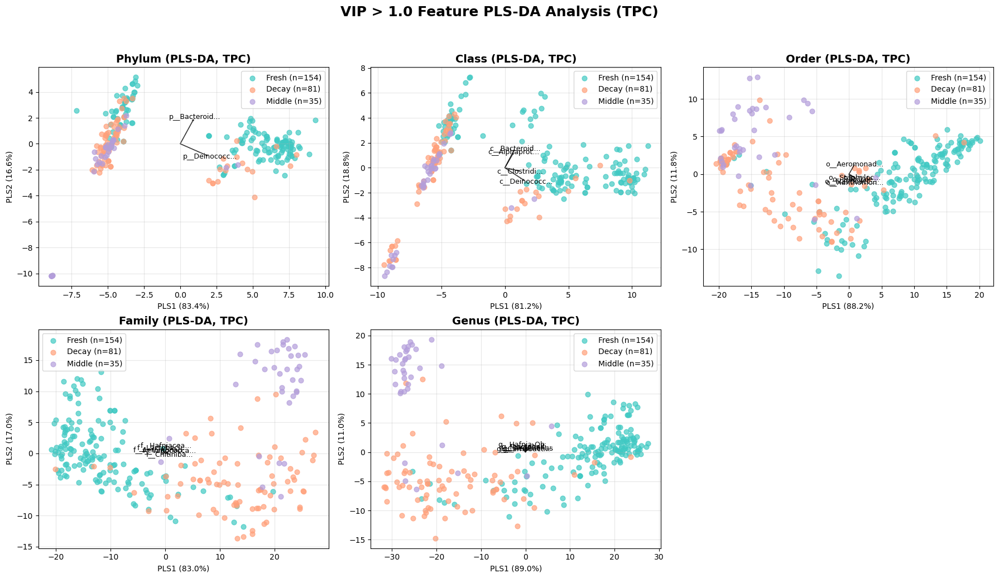

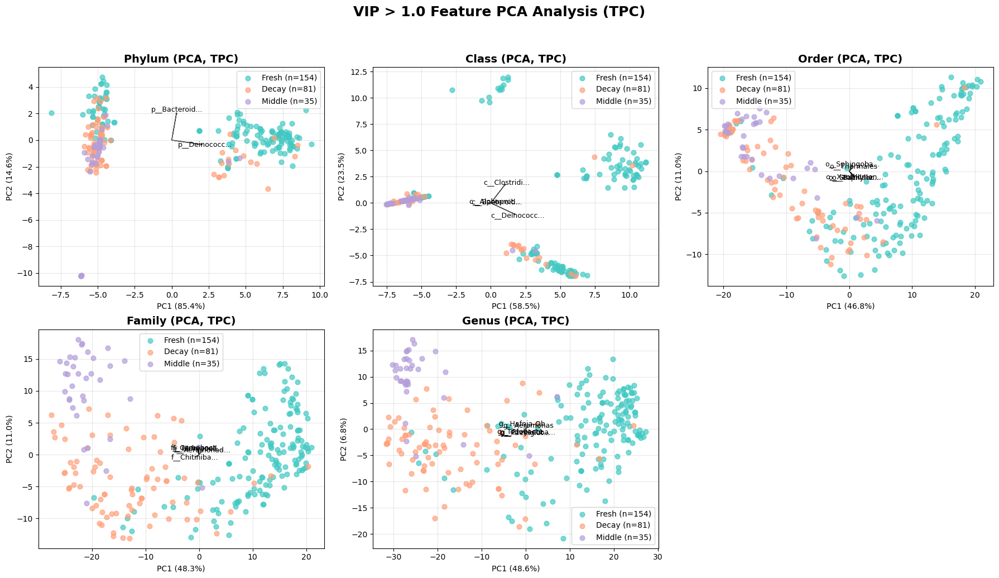

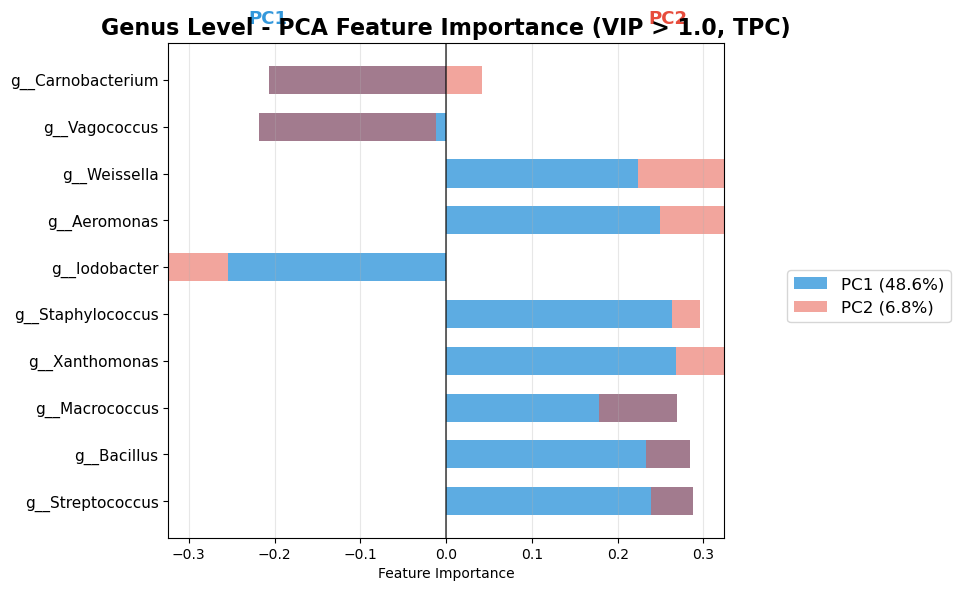

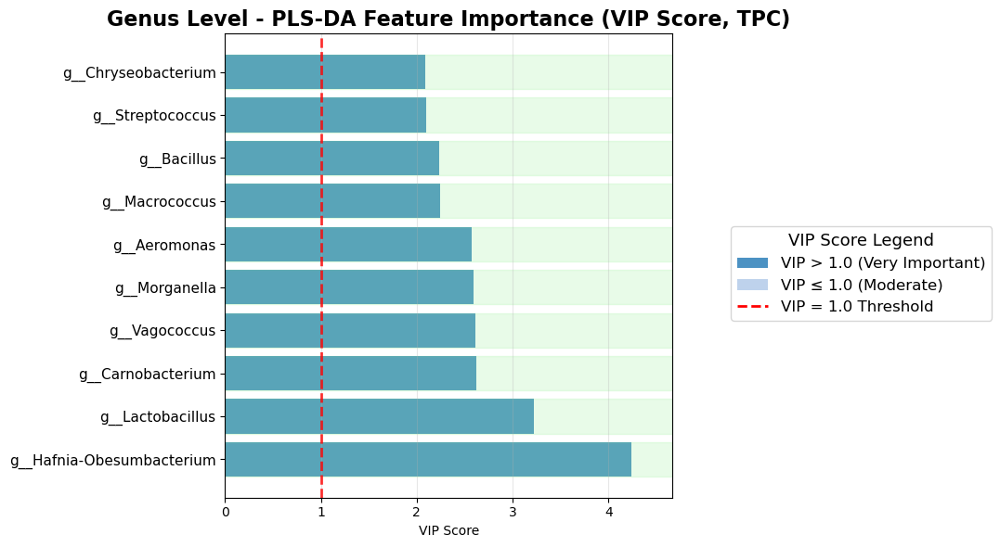

In [14]:
import numpy as np
import pandas as pd
from sklearn.cross_decomposition import PLSRegression
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# 색상/라벨 변수 통일
colors = {0: "#40c9c3", 1: "#ffa07a", 2: "#b39ddb"}
label_names = {0: "Fresh", 1: "Decay", 2: "Middle"}

def match_vip_features(vip_features, columns):
    """vip_features(괄호 제거됨)와 실제 컬럼명을 매칭하여 반환"""
    matched = []
    for v in vip_features:
        found = [col for col in columns if col.split(' (')[0] == v]
        if found:
            matched.append(found[0])
    return matched

# 1. PLS-DA scatter (TPC 기준, 영어 텍스트)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()
level_keys = list(vip_over1_dict.keys())
for idx, level_name in enumerate(level_keys):
    level_data = get_level_data(level_name)
    if level_data is None:
        print(f"{level_name}: No data, skipped")
        continue
    X = level_data['features']
    tpc = level_data['tpc']
    y = tpc_labeling(tpc)
    vip_features = vip_over1_dict[level_name]['Feature'].tolist()
    # 실제 컬럼명과 매칭
    matched_features = match_vip_features(vip_features, X.columns)
    if not matched_features:
        print(f"{level_name}: No VIP > 1.0 feature, skipped")
        continue
    X_vip = X[matched_features]
    y_onehot = np.zeros((len(y), 3))
    for i in range(len(y)):
        y_onehot[i, y[i]] = 1
    plsda = PLSRegression(n_components=2, scale=False)
    X_pls = plsda.fit_transform(X_vip, y_onehot)[0]
    exp_var = np.var(X_pls, axis=0) / np.sum(np.var(X_pls, axis=0)) * 100
    ax = axes[idx]
    for label in [0, 1, 2]:
        count = np.sum(y == label)
        ax.scatter(
            X_pls[y == label, 0], X_pls[y == label, 1],
            label=f"{label_names[label]} (n={count})", alpha=0.7, s=40, color=colors[label]
        )
    loadings = plsda.x_weights_
    loading_magnitudes = np.sqrt(loadings[:, 0]**2 + loadings[:, 1]**2)
    top_idx = np.argsort(loading_magnitudes)[-5:]
    for i in top_idx:
        ax.arrow(0, 0, loadings[i, 0]*2, loadings[i, 1]*2,
                 color='black', alpha=0.7, head_width=0.1, head_length=0.1)
        feat_name = vip_features[i]
        if len(feat_name) > 12:
            feat_name = feat_name[:12] + '...'
        ax.text(loadings[i, 0]*2.3, loadings[i, 1]*2.3, feat_name, fontsize=9, color='black', ha='center', va='center')
    ax.set_title(f"{level_name} (PLS-DA, TPC)", fontsize=14, fontweight='bold')
    ax.set_xlabel(f"PLS1 ({exp_var[0]:.1f}%)")
    ax.set_ylabel(f"PLS2 ({exp_var[1]:.1f}%)")
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=10, loc='best')
for j in range(len(level_keys), len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle("VIP > 1.0 Feature PLS-DA Analysis (TPC)", fontsize=18, fontweight='bold', y=1.03)
plt.show()

# 2. PCA scatter (TPC 기준, 영어 텍스트)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()
for idx, level_name in enumerate(level_keys):
    level_data = get_level_data(level_name)
    if level_data is None:
        print(f"{level_name}: No data, skipped")
        continue
    X = level_data['features']
    tpc = level_data['tpc']
    y = tpc_labeling(tpc)
    vip_features = vip_over1_dict[level_name]['Feature'].tolist()
    matched_features = match_vip_features(vip_features, X.columns)
    if not matched_features:
        print(f"{level_name}: No VIP > 1.0 feature, skipped")
        continue
    X_vip = X[matched_features]
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_vip)
    exp_var = pca.explained_variance_ratio_ * 100
    ax = axes[idx]
    for label in [0, 1, 2]:
        count = np.sum(y == label)
        ax.scatter(
            X_pca[y == label, 0], X_pca[y == label, 1],
            label=f"{label_names[label]} (n={count})", alpha=0.7, s=40, color=colors[label]
        )
    loadings = pca.components_.T
    loading_magnitudes = np.sqrt(loadings[:, 0]**2 + loadings[:, 1]**2)
    top_idx = np.argsort(loading_magnitudes)[-5:]
    for i in top_idx:
        ax.arrow(0, 0, loadings[i, 0]*2, loadings[i, 1]*2,
                 color='black', alpha=0.7, head_width=0.1, head_length=0.1)
        feat_name = vip_features[i]
        if len(feat_name) > 12:
            feat_name = feat_name[:12] + '...'
        ax.text(loadings[i, 0]*2.3, loadings[i, 1]*2.3, feat_name, fontsize=9, color='black', ha='center', va='center')
    ax.set_title(f"{level_name} (PCA, TPC)", fontsize=14, fontweight='bold')
    ax.set_xlabel(f"PC1 ({exp_var[0]:.1f}%)")
    ax.set_ylabel(f"PC2 ({exp_var[1]:.1f}%)")
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=10, loc='best')
for j in range(len(level_keys), len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle("VIP > 1.0 Feature PCA Analysis (TPC)", fontsize=18, fontweight='bold', y=1.03)
plt.show()

# 3. Genus level mirror bar chart (PCA, VIP Score, TPC 기준, 영어 텍스트)
level_name = 'Genus'
level_data = get_level_data(level_name)
vip_features = vip_over1_dict[level_name]['Feature'].tolist()
matched_features = match_vip_features(vip_features, level_data['features'].columns)
if matched_features:
    # PCA mirror bar chart (Top 10)
    X_vip = level_data['features'][matched_features]
    pca = PCA(n_components=2)
    pca.fit(X_vip)
    loadings = pca.components_.T
    exp_var = pca.explained_variance_ratio_ * 100
    pc1_loadings = loadings[:, 0]
    pc2_loadings = loadings[:, 1]
    feature_names = np.array(vip_features)  # 표시는 괄호 없는 이름
    top10_idx = np.argsort(np.abs(pc1_loadings))[-10:][::-1]
    top10_features = feature_names[top10_idx]
    top10_pc1 = pc1_loadings[top10_idx]
    top10_pc2 = pc2_loadings[top10_idx]
    ind = np.arange(len(top10_features))
    height = 0.6
    fig, ax = plt.subplots(figsize=(8, 6))
    bars1 = ax.barh(ind, top10_pc1, height, color='#3498db', label=f'PC1 ({exp_var[0]:.1f}%)', alpha=0.8)
    bars2 = ax.barh(ind, top10_pc2, height, color='#e74c3c', label=f'PC2 ({exp_var[1]:.1f}%)', left=top10_pc1, alpha=0.5)
    ax.set_yticks(ind)
    ax.set_yticklabels(top10_features, fontsize=11)
    ax.set_xlabel('Feature Importance')
    ax.set_title('Genus Level - PCA Feature Importance (VIP > 1.0, TPC)', fontsize=16, fontweight='bold')
    ax.axvline(0, color='black', linewidth=1.2, alpha=0.7)
    fig.legend(loc='center left', bbox_to_anchor=(0.98, 0.5), fontsize=12)
    ax.text(-max(abs(top10_pc1))*0.8, len(top10_features)+0.2, 'PC1', color='#3498db', fontsize=13, fontweight='bold')
    ax.text(max(abs(top10_pc2))*0.8, len(top10_features)+0.2, 'PC2', color='#e74c3c', fontsize=13, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='x')
    max_val = max(np.max(np.abs(top10_pc1)), np.max(np.abs(top10_pc2)))
    ax.set_xlim(-max_val*1.1, max_val*1.1)
    plt.tight_layout(rect=[0, 0, 0.93, 1])
    plt.show()

    # VIP Score mirror bar chart (Top 10)
    vip_df = vip_over1_dict[level_name]
    top10_vip = vip_df.sort_values('VIP_Score', ascending=False).head(10)
    top10_features_vip = top10_vip['Feature'].values
    top10_scores = top10_vip['VIP_Score'].values
    fig, ax = plt.subplots(figsize=(8, 6))
    bars = ax.barh(np.arange(10), top10_scores, color=['#1f77b4' if v > 1.0 else '#aec7e8' for v in top10_scores], alpha=0.8)
    ax.set_yticks(np.arange(10))
    ax.set_yticklabels(top10_features_vip, fontsize=11)
    ax.set_xlabel('VIP Score')
    ax.set_title('Genus Level - PLS-DA Feature Importance (VIP Score, TPC)', fontsize=16, fontweight='bold')
    ax.axvline(1.0, color='red', linestyle='--', linewidth=2, alpha=0.8)
    ax.grid(True, alpha=0.3, axis='x')
    for i in range(np.sum(top10_scores > 1.0)):
        ax.axhspan(i-0.4, i+0.4, alpha=0.2, color='lightgreen')
    ax.set_xlim(0, max(top10_scores)*1.1)
    legend_elements = [
        plt.Rectangle((0, 0), 1, 1, facecolor='#1f77b4', alpha=0.8, label='VIP > 1.0 (Very Important)'),
        plt.Rectangle((0, 0), 1, 1, facecolor='#aec7e8', alpha=0.8, label='VIP ≤ 1.0 (Moderate)'),
        plt.Line2D([0], [0], color='red', linestyle='--', linewidth=2, label='VIP = 1.0 Threshold')
    ]
    fig.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(0.98, 0.5), fontsize=12, title='VIP Score Legend', title_fontsize=13)
    plt.tight_layout(rect=[0, 0, 0.93, 1])
    plt.show()

## Heat map (Corrleation)
- 일단 Genus level로

## TBARS도 확인


=== Phylum Level: VIP Score > 1.0 (TBARS 기준) ===
VIP > 1.0 Feature 개수: 3 / 12


,Feature,VIP_Score
0,p__Deinococcota,2.267646
1,p__Bacteroidota,2.027229
2,p__Campilobacterota,1.564625



=== Class Level: VIP Score > 1.0 (TBARS 기준) ===
VIP > 1.0 Feature 개수: 5 / 13


,Feature,VIP_Score
0,c__Deinococci,2.008271
1,c__Alphaproteobacteria,1.541886
2,c__Campylobacteria,1.501922
3,c__Bacteroidia,1.357814
4,c__Clostridia,1.183247



=== Order Level: VIP Score > 1.0 (TBARS 기준) ===
VIP > 1.0 Feature 개수: 14 / 48


,Feature,VIP_Score
0,o__Bacilli(c),2.583417
1,o__Bacillales,2.230655
2,o__Xanthomonadales,1.897319
3,o__Staphylococcales,1.819150
4,o__Clostridiales,1.780911
5,o__Campylobacterales,1.749085
6,o__Aeromonadales,1.739302
7,o__Thermales,1.697357
8,o__Bifidobacteriales,1.585463
9,o__Caulobacterales,1.318281



=== Family Level: VIP Score > 1.0 (TBARS 기준) ===
VIP > 1.0 Feature 개수: 32 / 85


,Feature,VIP_Score
0,f__Flavobacteriaceae,2.651216
1,f__Comamonadaceae,2.065153
2,f__Bacilli(c),2.032753
3,f__Chitinibacteraceae,1.982003
4,f__Enterobacterales(o),1.935430
5,f__Prevotellaceae,1.801839
6,f__Bacillaceae,1.682711
7,f__Thermaceae,1.669976
8,f__Xanthomonadaceae,1.635536
9,f__Vagococcaceae,1.611174



=== Genus Level: VIP Score > 1.0 (TBARS 기준) ===
VIP > 1.0 Feature 개수: 47 / 133


,Feature,VIP_Score
0,g__Xanthomonas,2.111102
1,g__Myroides,2.100445
2,g__Microbacteriaceae(f),2.050552
3,g__Iodobacter,2.047118
4,g__Janthinobacterium,1.977094
5,g__Macrococcus,1.909495
6,g__Streptococcus,1.898997
7,g__Bacillus,1.894447
8,g__Enterobacterales(o),1.882333
9,g__Carnobacterium,1.870396



=== 모든 Level VIP > 1.0 Feature (TBARS 기준) 추출 완료 ===


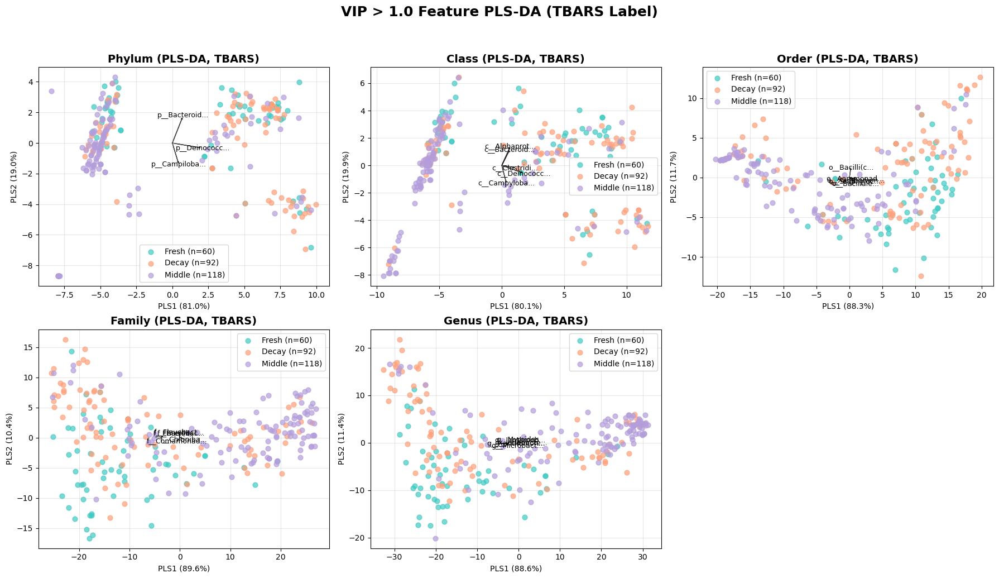

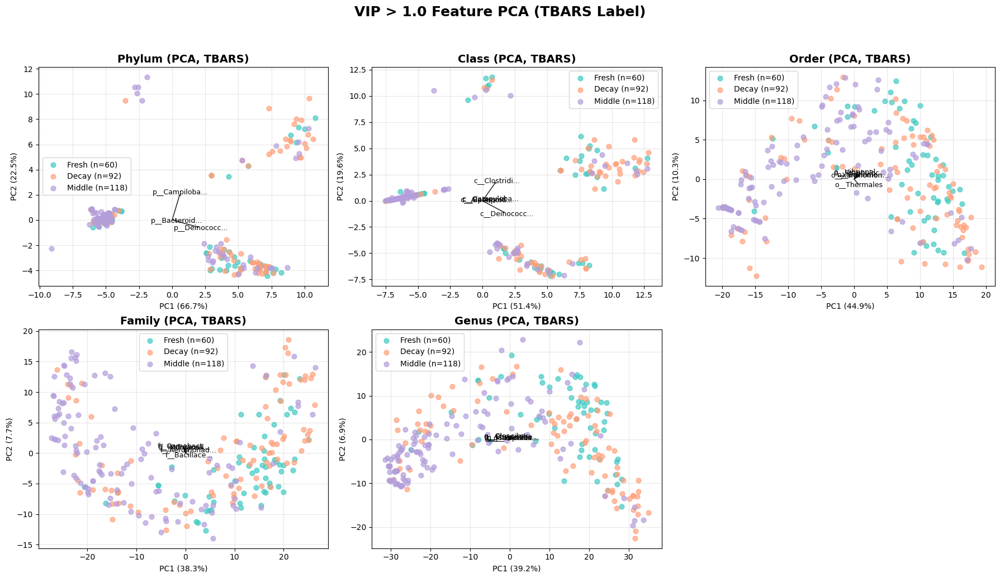

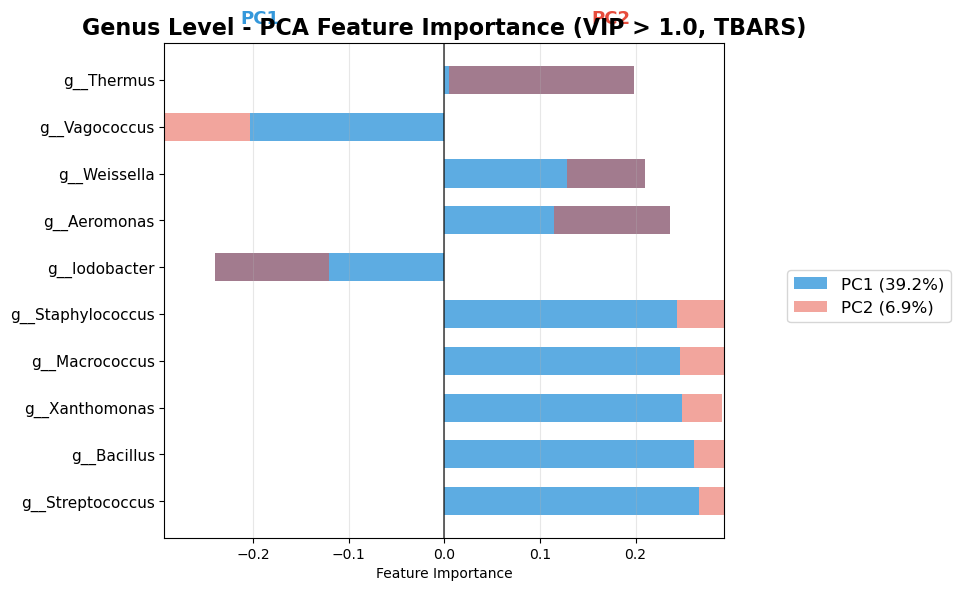

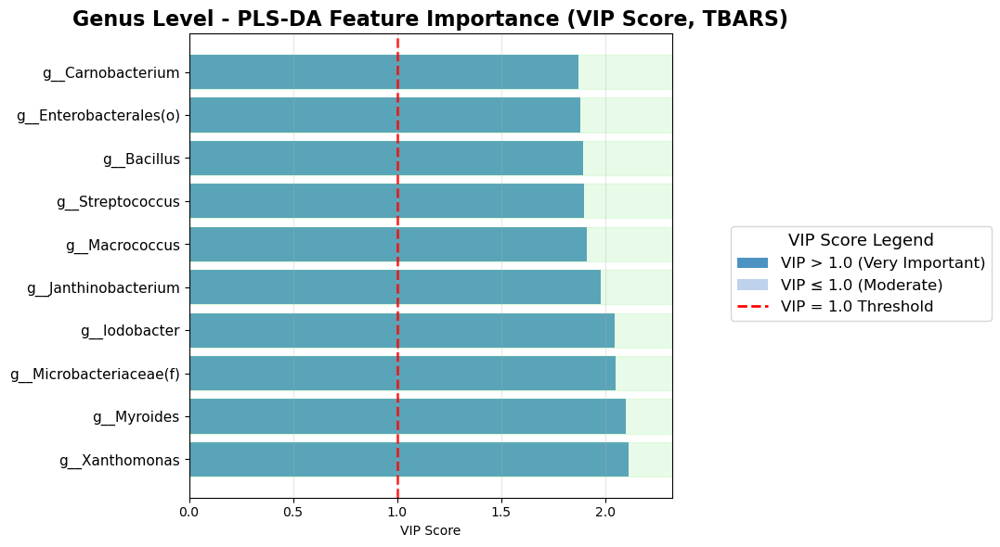

In [15]:
import numpy as np
import pandas as pd
from sklearn.cross_decomposition import PLSRegression
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from IPython.display import display

# TBARS 라벨링 함수 (임계값 반영)
def tbars_labeling(tbars_series):
    return np.where(
        tbars_series < 0.187, 0,
        np.where(tbars_series < 0.298, 1, 2)
    )  # 0: Fresh, 1: Middle, 2: Decay

level_names = ['Phylum', 'Class', 'Order', 'Family', 'Genus']
colors = {0: "#40c9c3", 1: "#ffa07a", 2: "#b39ddb"}
label_names = {0: "Fresh", 1: "Decay", 2: "Middle"}

# 1. VIP Score 1.0 이상 feature display 및 저장
vip_score_tbars = {}

for level_name in level_names:
    print(f"\n{'='*60}")
    print(f"=== {level_name} Level: VIP Score > 1.0 (TBARS 기준) ===")
    print(f"{'='*60}")

    level_data = get_level_data(level_name)
    X = level_data['features'][level_data['significant_features']]
    y = tbars_labeling(level_data['tbars'])

    # One-hot encoding
    y_onehot = np.zeros((len(y), 3))
    for i in range(len(y)):
        y_onehot[i, y[i]] = 1

    # PLS-DA
    plsda = PLSRegression(n_components=2, scale=False)
    plsda.fit(X, y_onehot)

    # VIP score 계산
    x_weights = plsda.x_weights_
    SS = np.sum(x_weights**2, axis=1)
    vip_scores = np.sqrt(len(X.columns) * SS / np.sum(SS))

    vip_df = pd.DataFrame({
        'Feature': X.columns,
        'VIP_Score': vip_scores
    }).sort_values('VIP_Score', ascending=False)

    vip_over1 = vip_df[vip_df['VIP_Score'] > 1.0].reset_index(drop=True)
    vip_score_tbars[level_name] = vip_over1

    print(f"VIP > 1.0 Feature 개수: {len(vip_over1)} / {len(vip_df)}")
    if len(vip_over1) > 0:
        display(vip_over1)
    else:
        print("VIP > 1.0인 Feature가 없습니다.")

print("\n=== 모든 Level VIP > 1.0 Feature (TBARS 기준) 추출 완료 ===")

# 2. PLS-DA scatter (TBARS 기준)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, level_name in enumerate(level_names):
    level_data = get_level_data(level_name)
    tbars = level_data['tbars']
    y = tbars_labeling(tbars)
    vip_features = vip_score_tbars[level_name]['Feature'].tolist()
    if not vip_features:
        print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
        continue
    X_vip = level_data['features'][vip_features]

    # PLS-DA
    y_onehot = np.zeros((len(y), 3))
    for i in range(len(y)):
        y_onehot[i, y[i]] = 1
    plsda = PLSRegression(n_components=2, scale=False)
    X_pls = plsda.fit_transform(X_vip, y_onehot)[0]
    exp_var = np.var(X_pls, axis=0) / np.sum(np.var(X_pls, axis=0)) * 100

    ax = axes[idx]
    for label in [0, 1, 2]:
        count = np.sum(y == label)
        ax.scatter(
            X_pls[y == label, 0], X_pls[y == label, 1],
            label=f"{label_names[label]} (n={count})", alpha=0.7, s=40, color=colors[label]
        )
    # 벡터(loading) 추가: 상위 5개만
    loadings = plsda.x_weights_
    loading_magnitudes = np.sqrt(loadings[:, 0]**2 + loadings[:, 1]**2)
    top_idx = np.argsort(loading_magnitudes)[-5:]
    for i in top_idx:
        ax.arrow(0, 0, loadings[i, 0]*2, loadings[i, 1]*2,
                 color='black', alpha=0.7, head_width=0.1, head_length=0.1)
        feat_name = vip_features[i]
        if len(feat_name) > 12:
            feat_name = feat_name[:12] + '...'
        ax.text(loadings[i, 0]*2.3, loadings[i, 1]*2.3, feat_name, fontsize=9, color='black', ha='center', va='center')
    ax.set_title(f"{level_name} (PLS-DA, TBARS)", fontsize=14, fontweight='bold')
    ax.set_xlabel(f"PLS1 ({exp_var[0]:.1f}%)")
    ax.set_ylabel(f"PLS2 ({exp_var[1]:.1f}%)")
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=10, loc='best')

for j in range(len(level_names), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle("VIP > 1.0 Feature PLS-DA (TBARS Label)", fontsize=18, fontweight='bold', y=1.03)
plt.show()

# 3. PCA scatter (TBARS 기준)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, level_name in enumerate(level_names):
    level_data = get_level_data(level_name)
    tbars = level_data['tbars']
    y = tbars_labeling(tbars)
    vip_features = vip_score_tbars[level_name]['Feature'].tolist()
    if not vip_features:
        print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
        continue
    X_vip = level_data['features'][vip_features]

    # PCA
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_vip)
    exp_var = pca.explained_variance_ratio_ * 100

    ax = axes[idx]
    for label in [0, 1, 2]:
        count = np.sum(y == label)
        ax.scatter(
            X_pca[y == label, 0], X_pca[y == label, 1],
            label=f"{label_names[label]} (n={count})", alpha=0.7, s=40, color=colors[label]
        )
    # 벡터(loading) 추가: 상위 5개만
    loadings = pca.components_.T
    loading_magnitudes = np.sqrt(loadings[:, 0]**2 + loadings[:, 1]**2)
    top_idx = np.argsort(loading_magnitudes)[-5:]
    for i in top_idx:
        ax.arrow(0, 0, loadings[i, 0]*2, loadings[i, 1]*2,
                 color='black', alpha=0.7, head_width=0.1, head_length=0.1)
        feat_name = vip_features[i]
        if len(feat_name) > 12:
            feat_name = feat_name[:12] + '...'
        ax.text(loadings[i, 0]*2.3, loadings[i, 1]*2.3, feat_name, fontsize=9, color='black', ha='center', va='center')
    ax.set_title(f"{level_name} (PCA, TBARS)", fontsize=14, fontweight='bold')
    ax.set_xlabel(f"PC1 ({exp_var[0]:.1f}%)")
    ax.set_ylabel(f"PC2 ({exp_var[1]:.1f}%)")
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=10, loc='best')

for j in range(len(level_names), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.suptitle("VIP > 1.0 Feature PCA (TBARS Label)", fontsize=18, fontweight='bold', y=1.03)
plt.show()

# 4. Genus level mirror bar chart (TBARS 기준, PCA/PLS-DA)
level_name = 'Genus'
level_data = get_level_data(level_name)
vip_features = vip_score_tbars[level_name]['Feature'].tolist()
if vip_features:
    # PCA mirror bar chart (Top 10)
    X_vip = level_data['features'][vip_features]
    pca = PCA(n_components=2)
    pca.fit(X_vip)
    loadings = pca.components_.T
    exp_var = pca.explained_variance_ratio_ * 100
    pc1_loadings = loadings[:, 0]
    pc2_loadings = loadings[:, 1]
    feature_names = np.array(vip_features)
    top10_idx = np.argsort(np.abs(pc1_loadings))[-10:][::-1]
    top10_features = feature_names[top10_idx]
    top10_pc1 = pc1_loadings[top10_idx]
    top10_pc2 = pc2_loadings[top10_idx]
    ind = np.arange(len(top10_features))
    height = 0.6
    fig, ax = plt.subplots(figsize=(8, 6))
    bars1 = ax.barh(ind, top10_pc1, height, color='#3498db', label=f'PC1 ({exp_var[0]:.1f}%)', alpha=0.8)
    bars2 = ax.barh(ind, top10_pc2, height, color='#e74c3c', label=f'PC2 ({exp_var[1]:.1f}%)', left=top10_pc1, alpha=0.5)
    ax.set_yticks(ind)
    ax.set_yticklabels(top10_features, fontsize=11)
    ax.set_xlabel('Feature Importance')
    ax.set_title('Genus Level - PCA Feature Importance (VIP > 1.0, TBARS)', fontsize=16, fontweight='bold')
    ax.axvline(0, color='black', linewidth=1.2, alpha=0.7)
    fig.legend(loc='center left', bbox_to_anchor=(0.98, 0.5), fontsize=12)
    ax.text(-max(abs(top10_pc1))*0.8, len(top10_features)+0.2, 'PC1', color='#3498db', fontsize=13, fontweight='bold')
    ax.text(max(abs(top10_pc2))*0.8, len(top10_features)+0.2, 'PC2', color='#e74c3c', fontsize=13, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='x')
    max_val = max(np.max(np.abs(top10_pc1)), np.max(np.abs(top10_pc2)))
    ax.set_xlim(-max_val*1.1, max_val*1.1)
    plt.tight_layout(rect=[0, 0, 0.93, 1])
    plt.show()

    # VIP Score mirror bar chart (Top 10, PLS-DA)
    vip_df = vip_score_tbars[level_name]
    top10_vip = vip_df.sort_values('VIP_Score', ascending=False).head(10)
    top10_features_vip = top10_vip['Feature'].values
    top10_scores = top10_vip['VIP_Score'].values
    fig, ax = plt.subplots(figsize=(8, 6))
    bars = ax.barh(np.arange(10), top10_scores, color=['#1f77b4' if v > 1.0 else '#aec7e8' for v in top10_scores], alpha=0.8)
    ax.set_yticks(np.arange(10))
    ax.set_yticklabels(top10_features_vip, fontsize=11)
    ax.set_xlabel('VIP Score')
    ax.set_title('Genus Level - PLS-DA Feature Importance (VIP Score, TBARS)', fontsize=16, fontweight='bold')
    ax.axvline(1.0, color='red', linestyle='--', linewidth=2, alpha=0.8)
    ax.grid(True, alpha=0.3, axis='x')
    for i in range(np.sum(top10_scores > 1.0)):
        ax.axhspan(i-0.4, i+0.4, alpha=0.2, color='lightgreen')
    ax.set_xlim(0, max(top10_scores)*1.1)
    legend_elements = [
        plt.Rectangle((0, 0), 1, 1, facecolor='#1f77b4', alpha=0.8, label='VIP > 1.0 (Very Important)'),
        plt.Rectangle((0, 0), 1, 1, facecolor='#aec7e8', alpha=0.8, label='VIP ≤ 1.0 (Moderate)'),
        plt.Line2D([0], [0], color='red', linestyle='--', linewidth=2, label='VIP = 1.0 Threshold')
    ]
    fig.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(0.98, 0.5), fontsize=12, title='VIP Score Legend', title_fontsize=13)
    plt.tight_layout(rect=[0, 0, 0.93, 1])
    plt.show()

## TBARS 기준으로 뽑힌 VIP Score 1.0 Feature 상관관계 분석

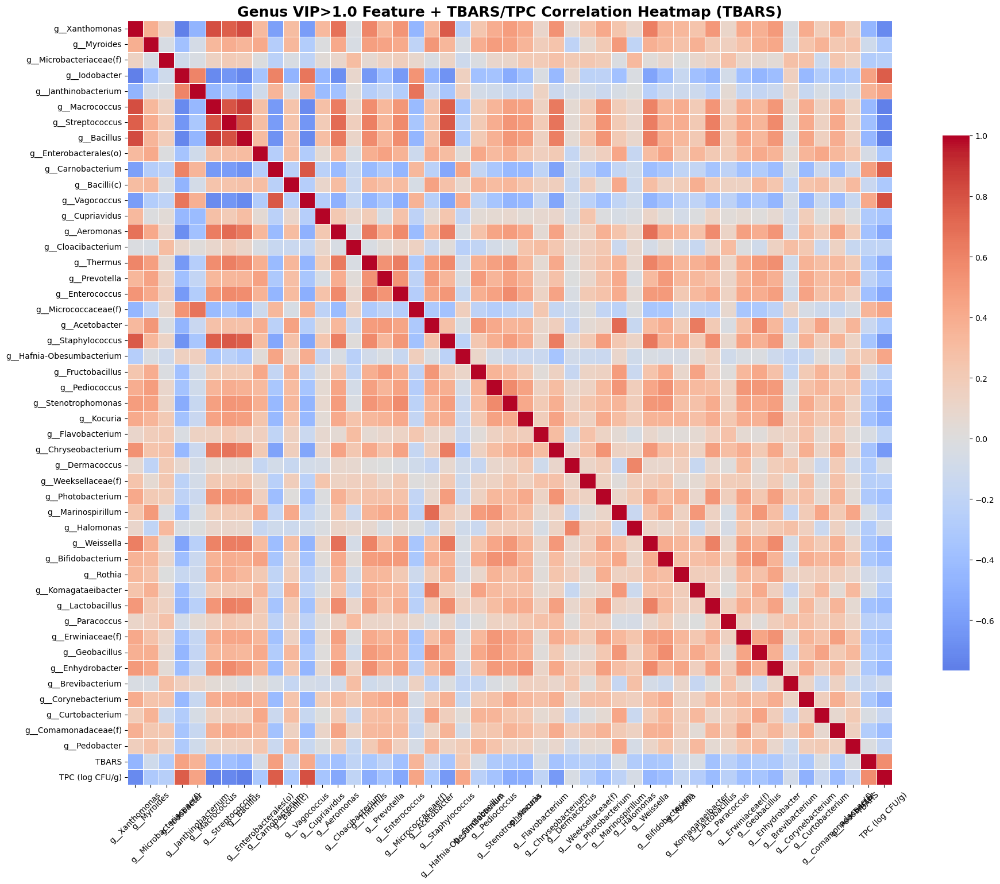

In [16]:
# TBARS 기준 VIP > 1.0 feature의 Genus level 상관관계 분석 Heatmap

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Genus level 데이터 및 VIP > 1.0 feature 추출
level_name = 'Genus'
level_data = get_level_data(level_name)
if level_data is None:
    print(f"{level_name}: 데이터 없음, 스킵")
else:
    # TBARS 기준 VIP > 1.0 feature 리스트
    vip_features = vip_score_tbars[level_name]['Feature'].tolist()
    if not vip_features:
        print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
    else:
        # Feature + TBARS + TPC 데이터프레임 생성
        X_vip = level_data['features'][vip_features].copy()
        X_vip['TBARS'] = level_data['tbars']
        X_vip['TPC (log CFU/g)'] = level_data['tpc']

        # 상관계수 행렬 계산
        corr_matrix = X_vip.corr()

        # 히트맵 시각화
        plt.figure(figsize=(min(1.2*len(X_vip.columns), 20), min(1.2*len(X_vip.columns), 16)))
        sns.heatmap(
            corr_matrix,
            cmap='coolwarm',
            center=0,
            square=True,
            linewidths=0.5,
            cbar_kws={"shrink": 0.7},
            xticklabels=True,
            yticklabels=True,
            annot=False
        )
        plt.title('Genus VIP>1.0 Feature + TBARS/TPC Correlation Heatmap (TBARS)', fontsize=18, fontweight='bold')
        plt.tight_layout()
        plt.xticks(rotation=45)
        plt.show()

## PC1 VIP Score Feature Importance 

/var/folders/f5/vpc6wvfd0d9g1tdw0h3gqqcc0000gn/T/ipykernel_10430/2872172160.py:46: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([f'{abs(x):.3f}' for x in ax.get_xticks()])


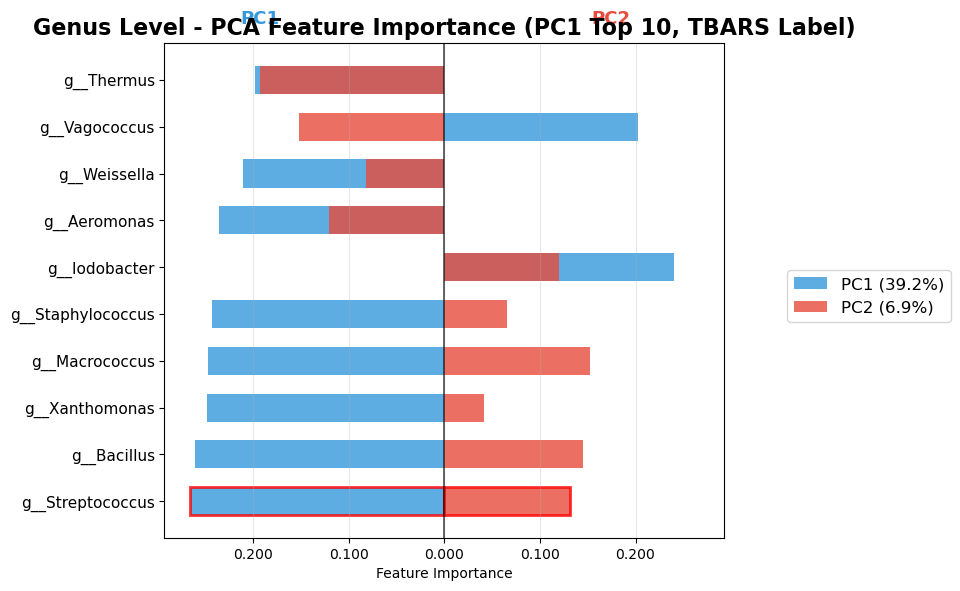

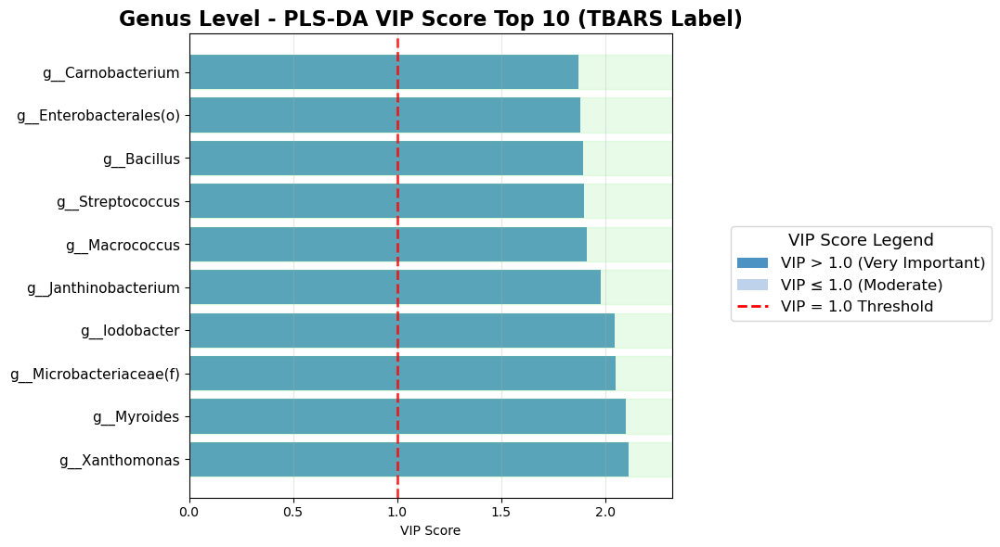

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# 1. TBARS 기준 Genus level PC1 Top 10 mirror bar chart
level_name = 'Genus'
level_data = get_level_data(level_name)
vip_features = vip_score_tbars[level_name]['Feature'].tolist()
if not vip_features:
    print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
else:
    X_vip = level_data['features'][vip_features]
    pca = PCA(n_components=2)
    pca.fit(X_vip)
    loadings = pca.components_.T
    exp_var = pca.explained_variance_ratio_ * 100

    pc1_loadings = loadings[:, 0]
    pc2_loadings = loadings[:, 1]
    feature_names = np.array(vip_features)
    top10_idx = np.argsort(np.abs(pc1_loadings))[-10:][::-1]
    top10_features = feature_names[top10_idx]
    top10_pc1 = pc1_loadings[top10_idx]
    top10_pc2 = pc2_loadings[top10_idx]

    ind = np.arange(len(top10_features))
    height = 0.6

    fig, ax = plt.subplots(figsize=(8, 6))
    bars1 = ax.barh(ind, -top10_pc1, height, color='#3498db', label=f'PC1 ({exp_var[0]:.1f}%)', alpha=0.8)
    bars2 = ax.barh(ind, top10_pc2, height, color='#e74c3c', label=f'PC2 ({exp_var[1]:.1f}%)', alpha=0.8)
    ax.set_yticks(ind)
    ax.set_yticklabels(top10_features, fontsize=11)
    ax.set_xlabel('Feature Importance')
    ax.set_title('Genus Level - PCA Feature Importance (PC1 Top 10, TBARS Label)', fontsize=16, fontweight='bold')
    ax.axvline(0, color='black', linewidth=1.2, alpha=0.7)
    fig.legend(loc='center left', bbox_to_anchor=(0.98, 0.5), fontsize=12)
    ax.text(-max(abs(top10_pc1))*0.8, len(top10_features)+0.2, 'PC1', color='#3498db', fontsize=13, fontweight='bold')
    ax.text(max(abs(top10_pc2))*0.8, len(top10_features)+0.2, 'PC2', color='#e74c3c', fontsize=13, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='x')
    max_val = max(np.max(np.abs(top10_pc1)), np.max(np.abs(top10_pc2)))
    ax.set_xlim(-max_val*1.1, max_val*1.1)
    bars1[0].set_edgecolor('red'); bars1[0].set_linewidth(2)
    bars2[0].set_edgecolor('red'); bars2[0].set_linewidth(2)
    ax.set_xticklabels([f'{abs(x):.3f}' for x in ax.get_xticks()])
    plt.tight_layout(rect=[0, 0, 0.93, 1])
    plt.show()

# 2. TBARS 기준 Genus level VIP Score Top 10 mirror bar chart
vip_df = vip_score_tbars[level_name]
top10_vip = vip_df.sort_values('VIP_Score', ascending=False).head(10)
top10_features_vip = top10_vip['Feature'].values
top10_scores = top10_vip['VIP_Score'].values

fig, ax = plt.subplots(figsize=(8, 6))
bars = ax.barh(np.arange(10), top10_scores, color=['#1f77b4' if v > 1.0 else '#aec7e8' for v in top10_scores], alpha=0.8)
ax.set_yticks(np.arange(10))
ax.set_yticklabels(top10_features_vip, fontsize=11)
ax.set_xlabel('VIP Score')
ax.set_title('Genus Level - PLS-DA VIP Score Top 10 (TBARS Label)', fontsize=16, fontweight='bold')
ax.axvline(1.0, color='red', linestyle='--', linewidth=2, alpha=0.8)
ax.grid(True, alpha=0.3, axis='x')
for i in range(np.sum(top10_scores > 1.0)):
    ax.axhspan(i-0.4, i+0.4, alpha=0.2, color='lightgreen')
ax.set_xlim(0, max(top10_scores)*1.1)
legend_elements = [
    plt.Rectangle((0, 0), 1, 1, facecolor='#1f77b4', alpha=0.8, label='VIP > 1.0 (Very Important)'),
    plt.Rectangle((0, 0), 1, 1, facecolor='#aec7e8', alpha=0.8, label='VIP ≤ 1.0 (Moderate)'),
    plt.Line2D([0], [0], color='red', linestyle='--', linewidth=2, label='VIP = 1.0 Threshold')
]
fig.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(0.98, 0.5), fontsize=12, title='VIP Score Legend', title_fontsize=13)
plt.tight_layout(rect=[0, 0, 0.93, 1])
plt.show()

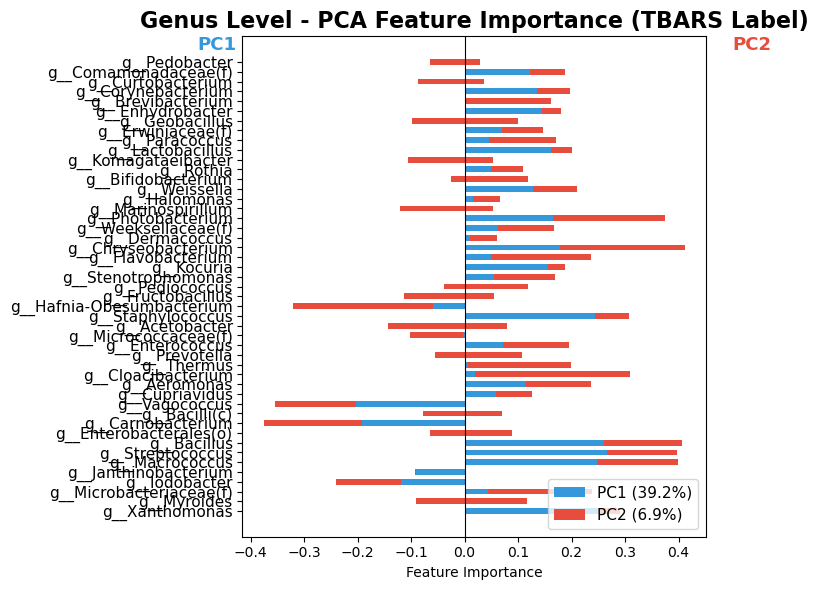

In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Genus level mirror bar chart (TBARS 기준)
level_name = 'Genus'
level_data = get_level_data(level_name)
vip_features = vip_score_tbars[level_name]['Feature'].tolist()
if not vip_features:
    print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
else:
    X_vip = level_data['features'][vip_features]

    # PCA
    pca = PCA(n_components=2)
    pca.fit(X_vip)
    loadings = pca.components_.T  # shape: (feature, PC)
    exp_var = pca.explained_variance_ratio_ * 100

    feature_names = vip_features
    pc1_loadings = loadings[:, 0]
    pc2_loadings = loadings[:, 1]

    ind = np.arange(len(feature_names))
    height = 0.6

    fig, ax = plt.subplots(figsize=(8, 6))
    ax.barh(ind, pc1_loadings, height, color='#3498db', label=f'PC1 ({exp_var[0]:.1f}%)')
    ax.barh(ind, pc2_loadings, height, color='#e74c3c', label=f'PC2 ({exp_var[1]:.1f}%)', left=pc1_loadings)

    ax.set_yticks(ind)
    ax.set_yticklabels(feature_names, fontsize=11)
    ax.set_xlabel('Feature Importance')
    ax.set_title('Genus Level - PCA Feature Importance (TBARS Label)', fontsize=16, fontweight='bold')
    ax.axvline(0, color='black', linewidth=0.8)
    ax.legend(loc='lower right', fontsize=11)
    ax.text(-0.5, len(feature_names)+0.2, 'PC1', color='#3498db', fontsize=13, fontweight='bold')
    ax.text(0.5, len(feature_names)+0.2, 'PC2', color='#e74c3c', fontsize=13, fontweight='bold')

    plt.tight_layout()
    plt.show()

## TPC 분류 모델 학습 

In [20]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, roc_curve, auc
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, label_binarize
import matplotlib.pyplot as plt
import seaborn as sns

# 사용할 모델과 파라미터 그리드 정의 (Pipeline 적용, prefix 적용)
model_configs = {
    "RandomForest": {
        "model": RandomForestClassifier,
        "params": {
            "n_estimators": [100, 200],
            "max_depth": [3, 5, 7],
            "min_samples_split": [2, 5]
        }
    },
    "XGBoost": {
        "model": XGBClassifier,
        "params": {
            "n_estimators": [100, 200],
            "max_depth": [3, 5, 7],
            "learning_rate": [0.05, 0.1]
        }
    },
    "SVC": {
        "model": lambda: Pipeline([
            ('scaler', StandardScaler()),
            ('svc', SVC(probability=True, class_weight="balanced"))
        ]),
        "params": {
            "svc__C": [0.5, 1, 2],
            "svc__gamma": ["scale", "auto"],
            "svc__kernel": ["rbf"]
        }
    },
    "LogisticRegression": {
        "model": lambda: Pipeline([
            ('scaler', StandardScaler()),
            ('lr', LogisticRegression())
        ]),
        "params": {
            "lr__penalty": ["elasticnet"],
            "lr__solver": ["saga"],
            "lr__l1_ratio": [0.2, 0.5, 0.8],
            "lr__C": [0.5, 1, 2],
            "lr__max_iter": [500],
            "lr__class_weight": ["balanced"],
            "lr__multi_class": ["multinomial"]
        }
    },
    "KNN": {
        "model": KNeighborsClassifier,
        "params": {
            "n_neighbors": [3, 5, 7],
            "weights": ["uniform", "distance"]
        }
    }
}

taxonomy_levels = ['Phylum', 'Class', 'Order', 'Family', 'Genus']

all_model_results = {}


def match_vip_features(vip_features, columns):
    """vip_features(괄호 제거됨)와 실제 컬럼명을 매칭하여 반환"""
    matched = []
    for v in vip_features:
        found = [col for col in columns if col.split(' (')[0] == v]
        if found:
            matched.append(found[0])
    return matched

for level_name in taxonomy_levels:
    print(f"\n{'='*60}\n=== {level_name} Level 모델 학습 시작 (VIP>1.0 Feature) ===\n{'='*60}")
    # 데이터 준비
    level_data = get_level_data(level_name)
    vip_features = vip_over1_dict[level_name]['Feature'].tolist()
    if not vip_features:
        print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
        continue
    # 실제 컬럼명과 매칭
    matched_features = match_vip_features(vip_features, level_data['features'].columns)
    if not matched_features:
        print(f"{level_name}: VIP > 1.0 feature 매칭 실패, 스킵")
        continue
    X = level_data['features'][matched_features].values
    y = tpc_labeling(level_data['tpc'].values)
    # ...이하 동일...
    
for level_name in taxonomy_levels:
    print(f"\n{'='*60}\n=== {level_name} Level 모델 학습 시작 (VIP>1.0 Feature) ===\n{'='*60}")
    # 데이터 준비
    level_data = get_level_data(level_name)
    vip_features = vip_over1_dict[level_name]['Feature'].tolist()
    if not vip_features:
        print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
        continue
    X = level_data['features'][vip_features].values
    y = tpc_labeling(level_data['tpc'].values)

    # train/test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

    all_model_results[level_name] = {}

    for model_name, config in model_configs.items():
        print(f"\n--- {model_name} 학습 ---")
        model = config["model"]() if callable(config["model"]) else config["model"]()
        param_grid = config["params"]

        grid = GridSearchCV(model, param_grid, cv=3, scoring='accuracy', n_jobs=-1)
        grid.fit(X_train, y_train)

        best_model = grid.best_estimator_
        best_params = grid.best_params_

        y_train_pred = best_model.predict(X_train)
        y_test_pred = best_model.predict(X_test)

        train_acc = accuracy_score(y_train, y_train_pred)
        test_acc = accuracy_score(y_test, y_test_pred)
        train_f1 = f1_score(y_train, y_train_pred, average='macro')
        test_f1 = f1_score(y_test, y_test_pred, average='macro')
        overfit_acc = train_acc - test_acc
        overfit_f1 = train_f1 - test_f1

        all_model_results[level_name][model_name] = {
            "train_accuracy": train_acc,
            "test_accuracy": test_acc,
            "train_f1_score": train_f1,
            "test_f1_score": test_f1,
            "Overfitting_Acc": overfit_acc,
            "Overfitting_F1": overfit_f1,
            "Best_Params": best_params,
            "Best_Model": best_model,
            "GridSearchCV": grid,
            "X_test": X_test,
            "y_test": y_test
        }

        print(f"Train Acc: {train_acc:.3f}, Test Acc: {test_acc:.3f}")
        print(f"Train F1: {train_f1:.3f}, Test F1: {test_f1:.3f}")
        print(f"Overfitting Acc: {overfit_acc:.3f}, Overfitting F1: {overfit_f1:.3f}")
        print(f"Best Params: {best_params}")

print("\n=== 모든 모델 학습 및 평가 완료 ===")

# Confusion Matrix & ROC Curve (숫자 표기)
model_list = ["RandomForest", "XGBoost", "SVC", "LogisticRegression", "KNN"]
label_order = [0, 1, 2]  # Fresh(0), Middle(1), Decay(2)
label_names = ["Fresh(0)", "Middle(1)", "Decay(2)"]

for model in model_list:
    # 1. Confusion Matrix (3x2 subplot, 숫자 표기)
    fig_cm, axes_cm = plt.subplots(2, 3, figsize=(16, 10))
    axes_cm = axes_cm.flatten()
    for i, level in enumerate(taxonomy_levels):
        if level not in all_model_results or model not in all_model_results[level]:
            axes_cm[i].set_axis_off()
            continue
        best_model = all_model_results[level][model]["Best_Model"]
        X_test = all_model_results[level][model]["X_test"]
        y_test = all_model_results[level][model]["y_test"]
        y_pred = best_model.predict(X_test)
        cm = confusion_matrix(y_test, y_pred, labels=label_order)
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=axes_cm[i], cbar=False,
                    xticklabels=label_names, yticklabels=label_names, vmin=0)
        acc = accuracy_score(y_test, y_pred)
        f1m = f1_score(y_test, y_pred, average='macro')
        axes_cm[i].set_title(f"{model} - {level}\nAcc: {acc:.3f}, F1M: {f1m:.3f}")
        axes_cm[i].set_xlabel("Predicted Label")
        axes_cm[i].set_ylabel("True Label")
    axes_cm[5].axis('off')
    plt.suptitle(f"{model} - Confusion Matrix (All Taxonomy Levels)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

    # 2. ROC Curve (3x2 subplot, 숫자 표기)
    fig_roc, axes_roc = plt.subplots(2, 3, figsize=(16, 10))
    axes_roc = axes_roc.flatten()
    for i, level in enumerate(taxonomy_levels):
        if level not in all_model_results or model not in all_model_results[level]:
            axes_roc[i].set_axis_off()
            continue
        best_model = all_model_results[level][model]["Best_Model"]
        X_test = all_model_results[level][model]["X_test"]
        y_test = all_model_results[level][model]["y_test"]
        y_test_bin = label_binarize(y_test, classes=label_order)
        y_score = best_model.predict_proba(X_test) if hasattr(best_model, "predict_proba") else None
        ax = axes_roc[i]
        if y_score is not None:
            for j in range(3):
                fpr, tpr, _ = roc_curve(y_test_bin[:, j], y_score[:, j])
                roc_auc = auc(fpr, tpr)
                ax.plot(fpr, tpr, label=f"{label_names[j]} (AUC={roc_auc:.2f})")
            ax.plot([0, 1], [0, 1], 'k--', lw=1)
            ax.set_xlim([0.0, 1.0])
            ax.set_ylim([0.0, 1.05])
            ax.set_xlabel('False Positive Rate')
            ax.set_ylabel('True Positive Rate')
            ax.set_title(f"{model} - {level} ROC")
            ax.legend(loc="lower right")
        else:
            ax.text(0.5, 0.5, "No predict_proba", ha='center', va='center')
            ax.set_axis_off()
    axes_roc[5].axis('off')
    plt.suptitle(f"{model} - ROC Curve (All Taxonomy Levels)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()


=== Phylum Level 모델 학습 시작 (VIP>1.0 Feature) ===

=== Class Level 모델 학습 시작 (VIP>1.0 Feature) ===

=== Order Level 모델 학습 시작 (VIP>1.0 Feature) ===

=== Family Level 모델 학습 시작 (VIP>1.0 Feature) ===

=== Genus Level 모델 학습 시작 (VIP>1.0 Feature) ===

=== Phylum Level 모델 학습 시작 (VIP>1.0 Feature) ===

--- RandomForest 학습 ---
Train Acc: 0.815, Test Acc: 0.722
Train F1: 0.686, Test F1: 0.621
Overfitting Acc: 0.093, Overfitting F1: 0.065
Best Params: {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 200}

--- XGBoost 학습 ---
Train Acc: 0.931, Test Acc: 0.685
Train F1: 0.914, Test F1: 0.610
Overfitting Acc: 0.245, Overfitting F1: 0.304
Best Params: {'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 200}

--- SVC 학습 ---
Train Acc: 0.736, Test Acc: 0.574
Train F1: 0.673, Test F1: 0.453
Overfitting Acc: 0.162, Overfitting F1: 0.220
Best Params: {'svc__C': 2, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}

--- LogisticRegression 학습 ---


/usr/local/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1264: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1264: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1264: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1264: FutureWarning: 'multi_cla

Train Acc: 0.736, Test Acc: 0.630
Train F1: 0.668, Test F1: 0.536
Overfitting Acc: 0.106, Overfitting F1: 0.131
Best Params: {'lr__C': 0.5, 'lr__class_weight': 'balanced', 'lr__l1_ratio': 0.8, 'lr__max_iter': 500, 'lr__multi_class': 'multinomial', 'lr__penalty': 'elasticnet', 'lr__solver': 'saga'}

--- KNN 학습 ---
Train Acc: 0.792, Test Acc: 0.722
Train F1: 0.740, Test F1: 0.648
Overfitting Acc: 0.069, Overfitting F1: 0.092
Best Params: {'n_neighbors': 7, 'weights': 'uniform'}

=== Class Level 모델 학습 시작 (VIP>1.0 Feature) ===

--- RandomForest 학습 ---


KeyboardInterrupt: 

## TPC 호ㅣ귀

In [23]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

print("=== TPC 회귀 모델 학습 (Fresh + Middle 샘플만 사용) ===")

# VIP feature명과 실제 컬럼명 매칭 함수
def match_vip_features(vip_features, columns):
    """vip_features(괄호 제거됨)와 실제 컬럼명을 매칭하여 반환"""
    matched = []
    for v in vip_features:
        found = [col for col in columns if col.split(' (')[0] == v]
        if found:
            matched.append(found[0])
    return matched

# Genus level 데이터 준비 (Fresh와 Middle만 사용)
level_name = 'Genus'
level_data = get_level_data(level_name)
vip_features = vip_over1_dict[level_name]['Feature'].tolist()

if not vip_features:
    print("VIP > 1.0 feature 없음")
else:
    # TPC 라벨링
    y_labels = tpc_labeling(level_data['tpc'].values)
    
    # Fresh(0)과 Middle(1)만 선택
    fresh_middle_mask = (y_labels == 0) | (y_labels == 1)
    
    # 실제 컬럼명과 매칭
    matched_features = match_vip_features(vip_features, level_data['features'].columns)
    if not matched_features:
        print("VIP > 1.0 feature 매칭 실패")
    else:
        X = level_data['features'][matched_features].iloc[fresh_middle_mask].values
        y = level_data['tpc'].iloc[fresh_middle_mask].values

        print(f"Fresh + Middle 샘플 수: {len(X)}")
        print(f"TPC 범위: {y.min():.2f} ~ {y.max():.2f}")
        print(f"사용 Feature 수: {len(matched_features)}")
        
        # Train/Test Split
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # 모델 및 파라미터 정의
        model_configs = {
            "LightGBM": {
                "model": LGBMRegressor,
                "params": {
                    "n_estimators": [100, 200],
                    "max_depth": [3, 5, 7],
                    "learning_rate": [0.05, 0.1, 0.2],
                    "num_leaves": [20, 31, 50],
                    "random_state": [42]
                }
            },
            "RandomForest": {
                "model": RandomForestRegressor,
                "params": {
                    "n_estimators": [100, 200],
                    "max_depth": [3, 5, 7, None],
                    "min_samples_split": [2, 5],
                    "random_state": [42]
                }
            },
            "XGBoost": {
                "model": XGBRegressor,
                "params": {
                    "n_estimators": [100, 200],
                    "max_depth": [3, 5, 7],
                    "learning_rate": [0.05, 0.1, 0.2],
                    "random_state": [42]
                }
            },
            "SVR": {
                "model": lambda: Pipeline([
                    ('scaler', StandardScaler()),
                    ('svr', SVR())
                ]),
                "params": {
                    "svr__C": [0.1, 1, 10],
                    "svr__gamma": ["scale", "auto"],
                    "svr__kernel": ["rbf", "linear"]
                }
            }
        }

        # 성능 평가 함수
        def calculate_rsd(y_true, y_pred):
            """RSD (Relative Standard Deviation) 계산"""
            rmse = np.sqrt(mean_squared_error(y_true, y_pred))
            mean_true = np.mean(y_true)
            return (rmse / mean_true) * 100

        # 모델 학습 및 평가
        regression_results = {}

        for model_name, config in model_configs.items():
            print(f"\n--- {model_name} 학습 중 ---")
            
            model = config["model"]() if callable(config["model"]) else config["model"]()
            param_grid = config["params"]
            
            # GridSearchCV
            grid = GridSearchCV(
                model, param_grid, 
                cv=5, scoring='neg_mean_absolute_error', 
                n_jobs=-1, verbose=0
            )
            grid.fit(X_train, y_train)
            
            best_model = grid.best_estimator_
            best_params = grid.best_params_
            
            # 예측
            y_train_pred = best_model.predict(X_train)
            y_test_pred = best_model.predict(X_test)
            
            # 성능 지표 계산
            train_mae = mean_absolute_error(y_train, y_train_pred)
            test_mae = mean_absolute_error(y_test, y_test_pred)
            train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
            test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
            train_r2 = r2_score(y_train, y_train_pred)
            test_r2 = r2_score(y_test, y_test_pred)
            train_rsd = calculate_rsd(y_train, y_train_pred)
            test_rsd = calculate_rsd(y_test, y_test_pred)
            
            # Cross Validation
            cv_mae_scores = -cross_val_score(best_model, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
            cv_rmse_scores = np.sqrt(-cross_val_score(best_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error'))
            cv_r2_scores = cross_val_score(best_model, X_train, y_train, cv=5, scoring='r2')
            
            cv_mae_mean = np.mean(cv_mae_scores)
            cv_rmse_mean = np.mean(cv_rmse_scores)
            cv_r2_mean = np.mean(cv_r2_scores)
            
            overfit_r2 = train_r2 - test_r2
            
            # 결과 저장
            regression_results[model_name] = {
                "Train_MAE": train_mae,
                "Test_MAE": test_mae,
                "Train_RMSE": train_rmse,
                "Test_RMSE": test_rmse,
                "Train_R2": train_r2,
                "Test_R2": test_r2,
                "Train_RSD": train_rsd,
                "Test_RSD": test_rsd,
                "CV_MAE_Mean": cv_mae_mean,
                "CV_RMSE_Mean": cv_rmse_mean,
                "CV_R2_Mean": cv_r2_mean,
                "Overfit_R2": overfit_r2,
                "Best_Params": best_params,
                "Best_Model": best_model,
                "y_train_pred": y_train_pred,
                "y_test_pred": y_test_pred,
                "X_train": X_train,
                "X_test": X_test,
                "y_train": y_train,
                "y_test": y_test
            }
            
            print(f"Test MAE: {test_mae:.3f}, Test RMSE: {test_rmse:.3f}, Test R²: {test_r2:.3f}")
            print(f"CV R² Mean: {cv_r2_mean:.3f}, Overfit R²: {overfit_r2:.3f}")

        print("\n=== TPC 회귀 모델 학습 완료 ===")

=== TPC 회귀 모델 학습 (Fresh + Middle 샘플만 사용) ===
Fresh + Middle 샘플 수: 235
TPC 범위: 2.06 ~ 6.42
사용 Feature 수: 27

--- LightGBM 학습 중 ---


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001046 seconds.
You can set `force_col_wise=true` to remove the overhead.[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001100 seconds.
You can set `force_col_wise=true` to remove the overhead.[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001074 seconds.
You can set `force_col_wise=true` to remove the overhead.

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001090 seconds.
You can set `force_col_wise=true` to remove the overhead.

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001129 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Auto-choos

In [24]:
import os
import pandas as pd

# 결과 디렉토리 생성
result_dir = "model_result"
os.makedirs(result_dir, exist_ok=True)

# 결과 DataFrame 생성
result_rows = []
for model_name, results in regression_results.items():
    row = {
        "Model": model_name,
        "Train_MAE": results["Train_MAE"],
        "Test_MAE": results["Test_MAE"],
        "Train_RMSE": results["Train_RMSE"],
        "Test_RMSE": results["Test_RMSE"],
        "Train_R2": results["Train_R2"],
        "Test_R2": results["Test_R2"],
        "Train_RSD": results["Train_RSD"],
        "Test_RSD": results["Test_RSD"],
        "CV_MAE_Mean": results["CV_MAE_Mean"],
        "CV_RMSE_Mean": results["CV_RMSE_Mean"],
        "CV_R2_Mean": results["CV_R2_Mean"],
        "Overfit_R2": results["Overfit_R2"],
        "Best_Params": str(results["Best_Params"])
    }
    result_rows.append(row)

# DataFrame 생성 및 정렬
df_regression = pd.DataFrame(result_rows)
df_regression = df_regression.sort_values("Test_R2", ascending=False).reset_index(drop=True)

# 엑셀 파일로 저장
excel_path = os.path.join(result_dir, "clr_optuna_vip_tpc.xlsx")
df_regression.to_excel(excel_path, index=False)

print(f"TPC 회귀 모델 결과가 '{excel_path}'에 저장되었습니다.")
print("\n=== 결과 요약 ===")
print(df_regression[['Model', 'Test_MAE', 'Test_RMSE', 'Test_R2', 'CV_R2_Mean', 'Overfit_R2']].to_string(index=False))

TPC 회귀 모델 결과가 'model_result/clr_optuna_vip_tpc.xlsx'에 저장되었습니다.

=== 결과 요약 ===
       Model  Test_MAE  Test_RMSE  Test_R2  CV_R2_Mean  Overfit_R2
         SVR  0.328355   0.456790 0.840481    0.677098    0.070294
     XGBoost  0.373321   0.527359 0.787386    0.701798    0.164049
    LightGBM  0.394187   0.534704 0.781423    0.703180    0.135409
RandomForest  0.402463   0.546895 0.771342    0.687936    0.154558


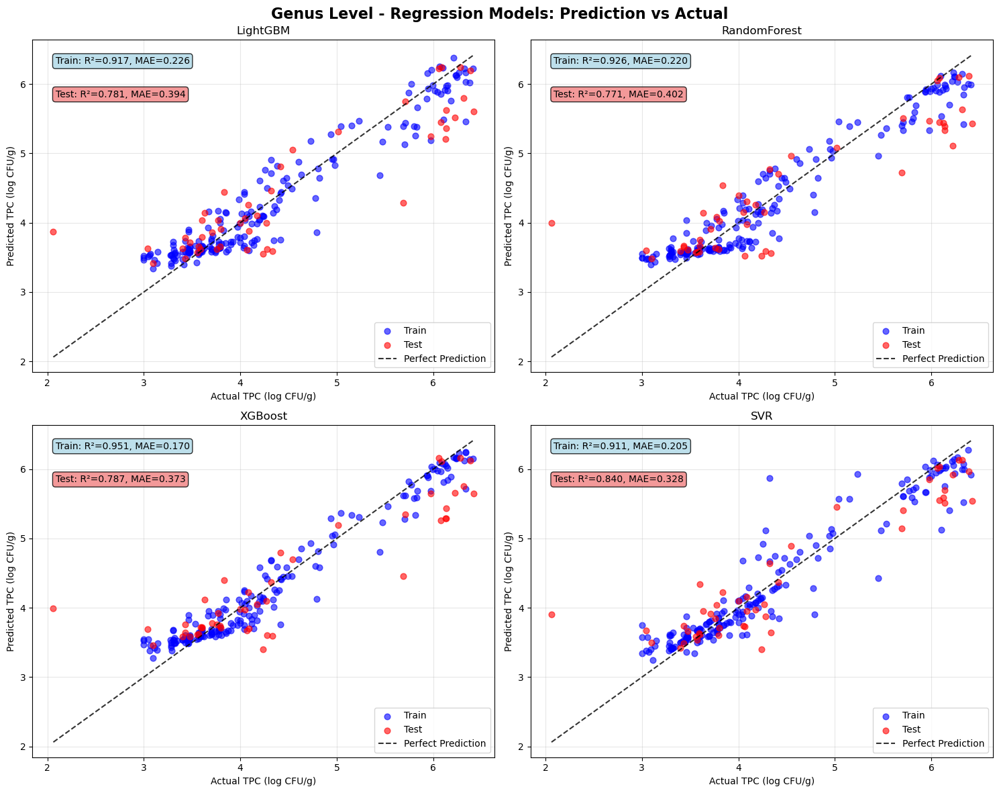

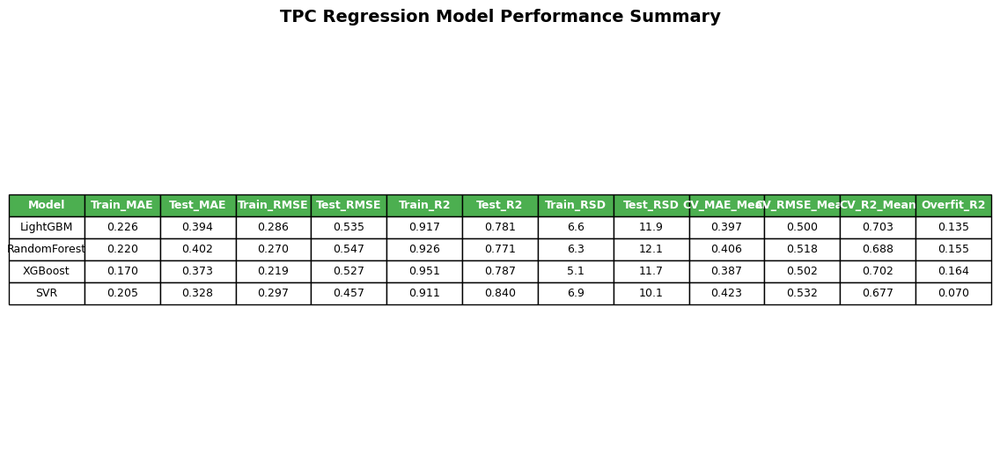

In [25]:
import matplotlib.pyplot as plt
import numpy as np

# Prediction vs Actual 시각화
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.flatten()

model_names = list(regression_results.keys())
colors = {'Train': 'blue', 'Test': 'red'}

for idx, model_name in enumerate(model_names):
    results = regression_results[model_name]
    ax = axes[idx]
    
    # Train 데이터
    ax.scatter(results['y_train'], results['y_train_pred'], 
               alpha=0.6, color=colors['Train'], label='Train', s=40)
    
    # Test 데이터
    ax.scatter(results['y_test'], results['y_test_pred'], 
               alpha=0.6, color=colors['Test'], label='Test', s=40)
    
    # Perfect prediction line
    min_val = min(np.min(results['y_train']), np.min(results['y_test']))
    max_val = max(np.max(results['y_train']), np.max(results['y_test']))
    ax.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.8, label='Perfect Prediction')
    
    # 성능 지표 표시
    train_r2 = results['Train_R2']
    test_r2 = results['Test_R2']
    train_mae = results['Train_MAE']
    test_mae = results['Test_MAE']
    
    ax.text(0.05, 0.95, f'Train: R²={train_r2:.3f}, MAE={train_mae:.3f}', 
            transform=ax.transAxes, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
    ax.text(0.05, 0.85, f'Test: R²={test_r2:.3f}, MAE={test_mae:.3f}', 
            transform=ax.transAxes, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.8))
    
    ax.set_xlabel('Actual TPC (log CFU/g)')
    ax.set_ylabel('Predicted TPC (log CFU/g)')
    ax.set_title(f'{model_name}')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.suptitle('Genus Level - Regression Models: Prediction vs Actual', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# 성능 지표 요약 테이블 시각화
fig, ax = plt.subplots(figsize=(12, 6))
ax.axis('tight')
ax.axis('off')

# 테이블 데이터 준비
table_data = []
for model_name in model_names:
    results = regression_results[model_name]
    table_data.append([
        model_name,
        f"{results['Train_MAE']:.3f}",
        f"{results['Test_MAE']:.3f}",
        f"{results['Train_RMSE']:.3f}",
        f"{results['Test_RMSE']:.3f}",
        f"{results['Train_R2']:.3f}",
        f"{results['Test_R2']:.3f}",
        f"{results['Train_RSD']:.1f}",
        f"{results['Test_RSD']:.1f}",
        f"{results['CV_MAE_Mean']:.3f}",
        f"{results['CV_RMSE_Mean']:.3f}",
        f"{results['CV_R2_Mean']:.3f}",
        f"{results['Overfit_R2']:.3f}"
    ])

headers = ['Model', 'Train_MAE', 'Test_MAE', 'Train_RMSE', 'Test_RMSE', 
           'Train_R2', 'Test_R2', 'Train_RSD', 'Test_RSD', 
           'CV_MAE_Mean', 'CV_RMSE_Mean', 'CV_R2_Mean', 'Overfit_R2']

table = ax.table(cellText=table_data, colLabels=headers, 
                cellLoc='center', loc='center', fontsize=10)
table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1.2, 1.5)

# 헤더 스타일링
for i in range(len(headers)):
    table[(0, i)].set_facecolor('#4CAF50')
    table[(0, i)].set_text_props(weight='bold', color='white')

plt.title('TPC Regression Model Performance Summary', fontsize=14, fontweight='bold', pad=20)
plt.show()

## TBARS 분류 모델 학습 


=== Phylum Level 모델 학습 시작 (VIP>1.0 Feature, TBARS) ===

--- RandomForest 학습 ---
Train Acc: 0.630, Test Acc: 0.556
Train F1: 0.533, Test F1: 0.445
Overfitting Acc: 0.074, Overfitting F1: 0.088
Best Params: {'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 200}

--- XGBoost 학습 ---
Train Acc: 0.940, Test Acc: 0.593
Train F1: 0.936, Test F1: 0.553
Overfitting Acc: 0.347, Overfitting F1: 0.383
Best Params: {'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 100}

--- SVC 학습 ---
Train Acc: 0.542, Test Acc: 0.574
Train F1: 0.511, Test F1: 0.533
Overfitting Acc: -0.032, Overfitting F1: -0.022
Best Params: {'svc__C': 0.5, 'svc__gamma': 'scale', 'svc__kernel': 'rbf'}

--- LogisticRegression 학습 ---
Train Acc: 0.514, Test Acc: 0.611
Train F1: 0.485, Test F1: 0.602
Overfitting Acc: -0.097, Overfitting F1: -0.117
Best Params: {'lr__C': 0.5, 'lr__class_weight': 'balanced', 'lr__l1_ratio': 0.5, 'lr__max_iter': 500, 'lr__multi_class': 'multinomial', 'lr__penalty': 'elasticnet', 'lr__solver'

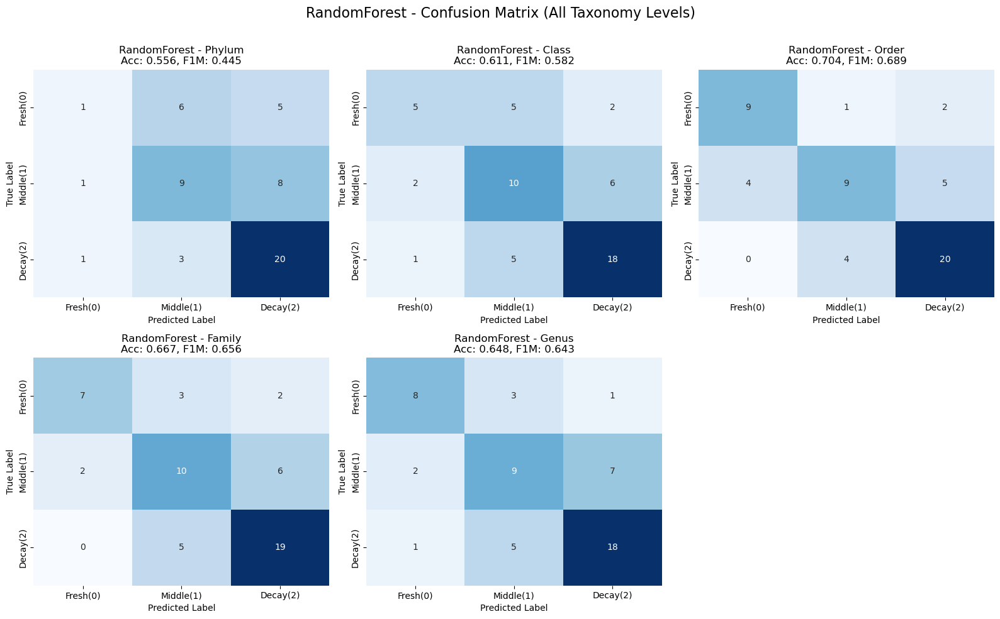

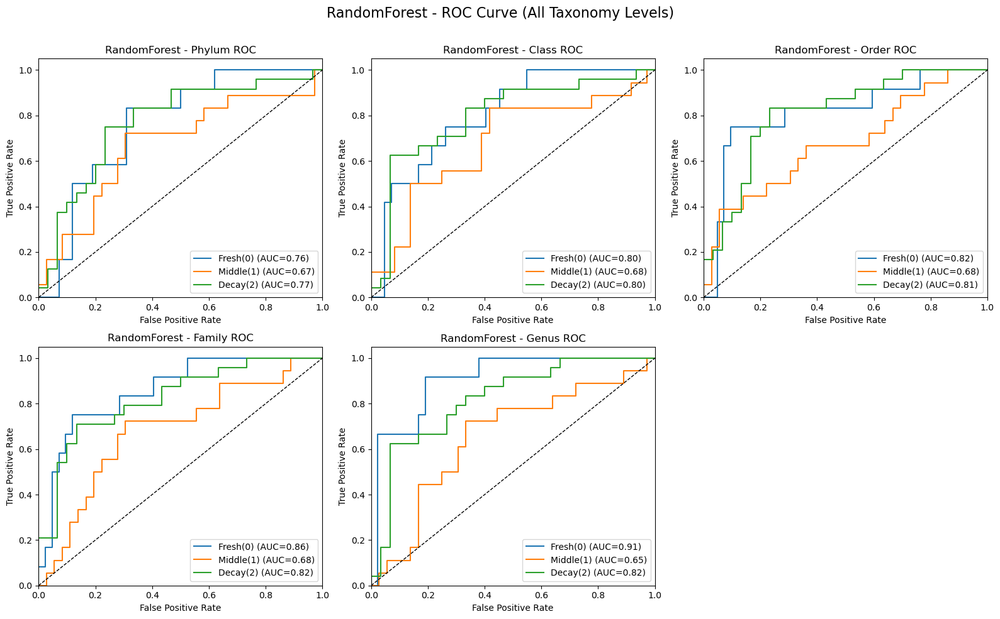

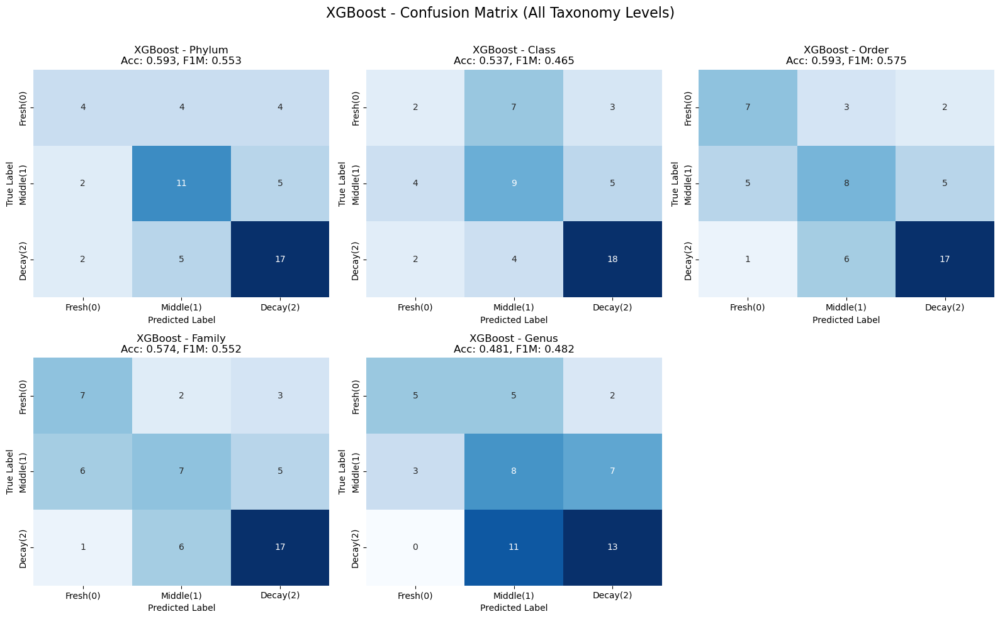

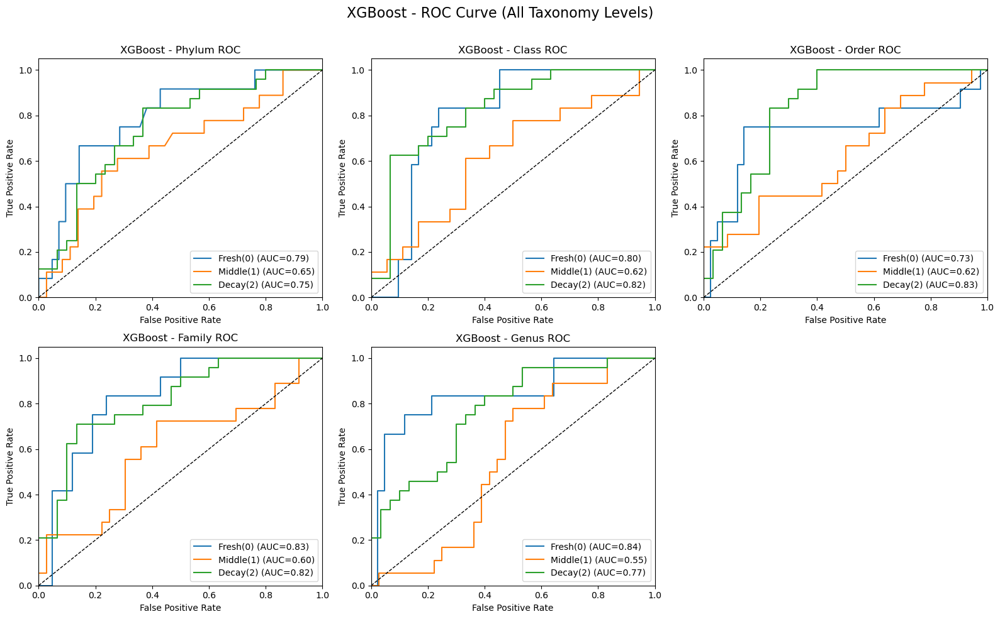

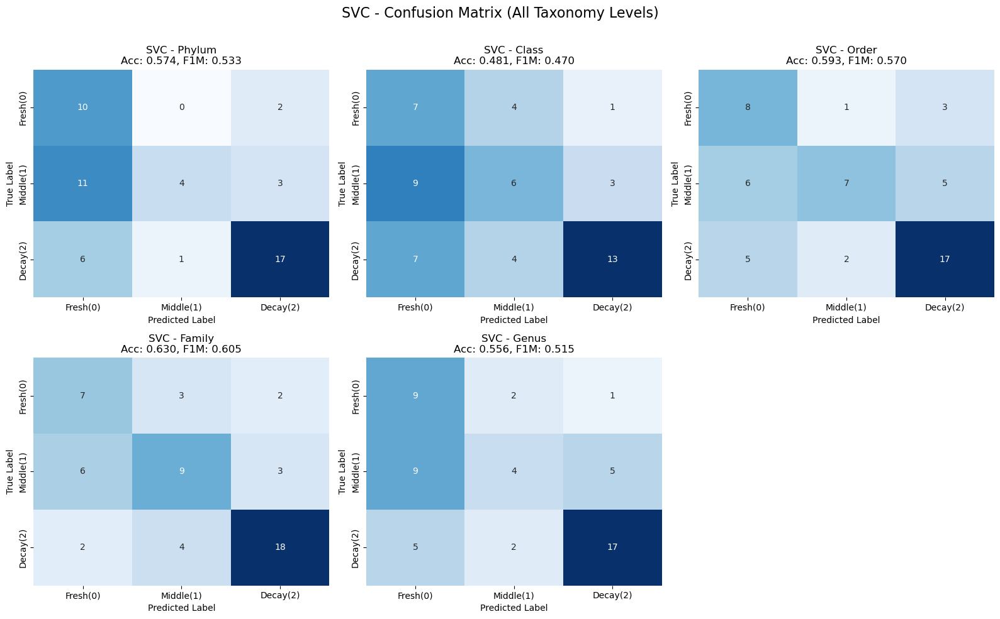

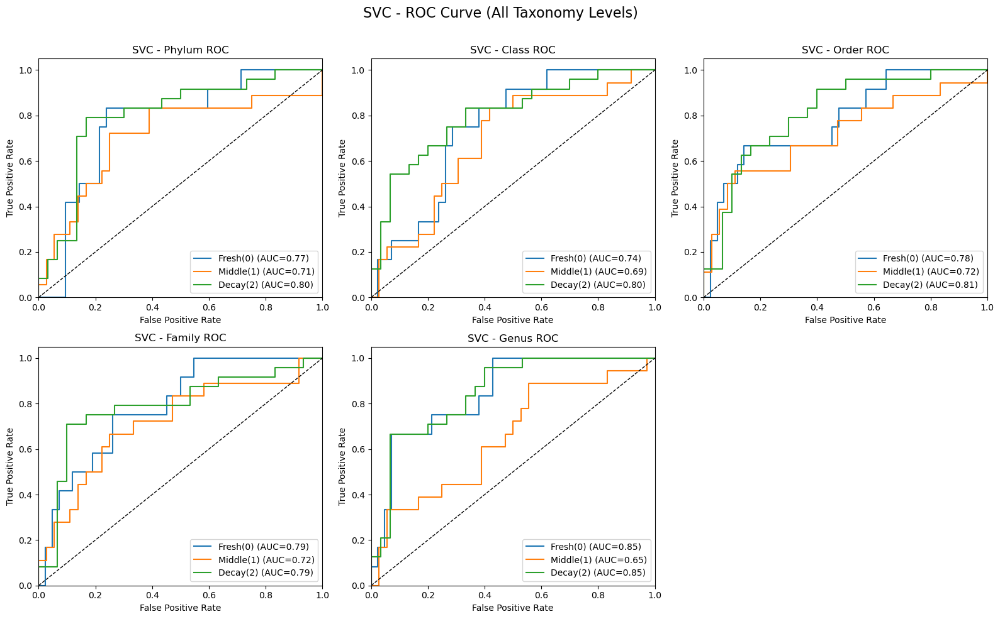

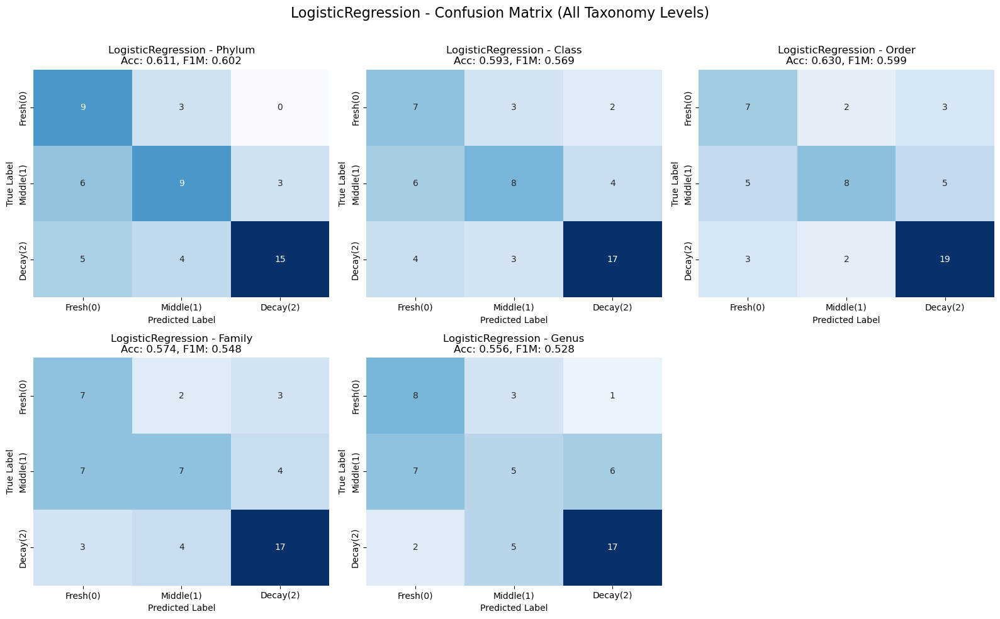

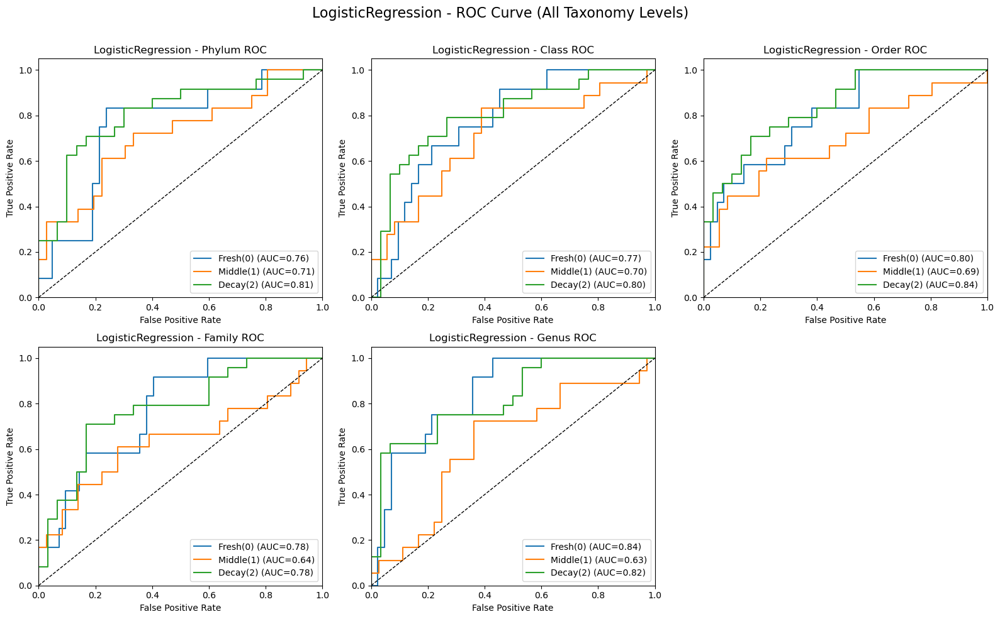

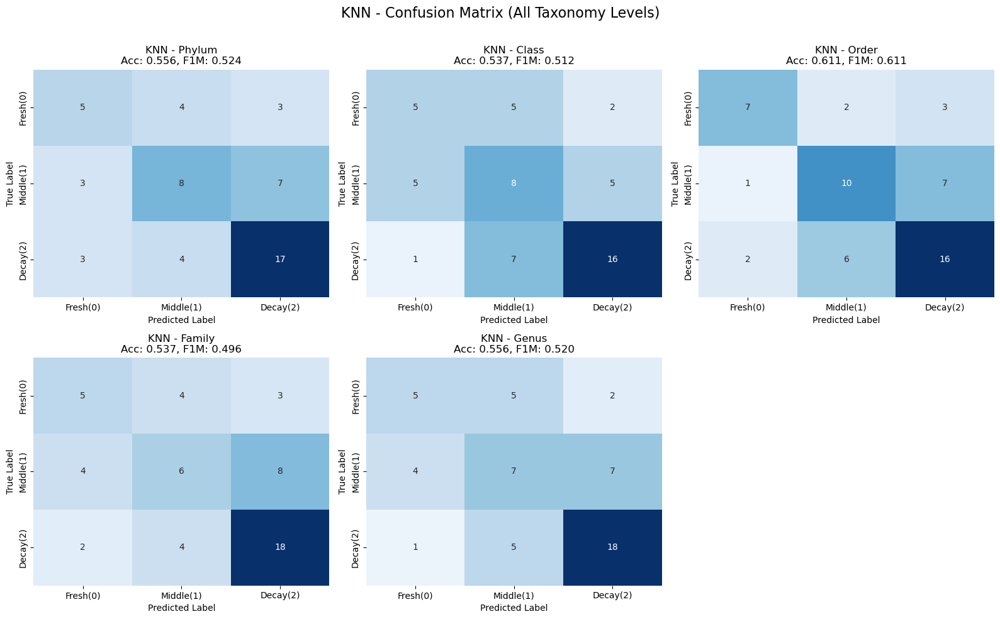

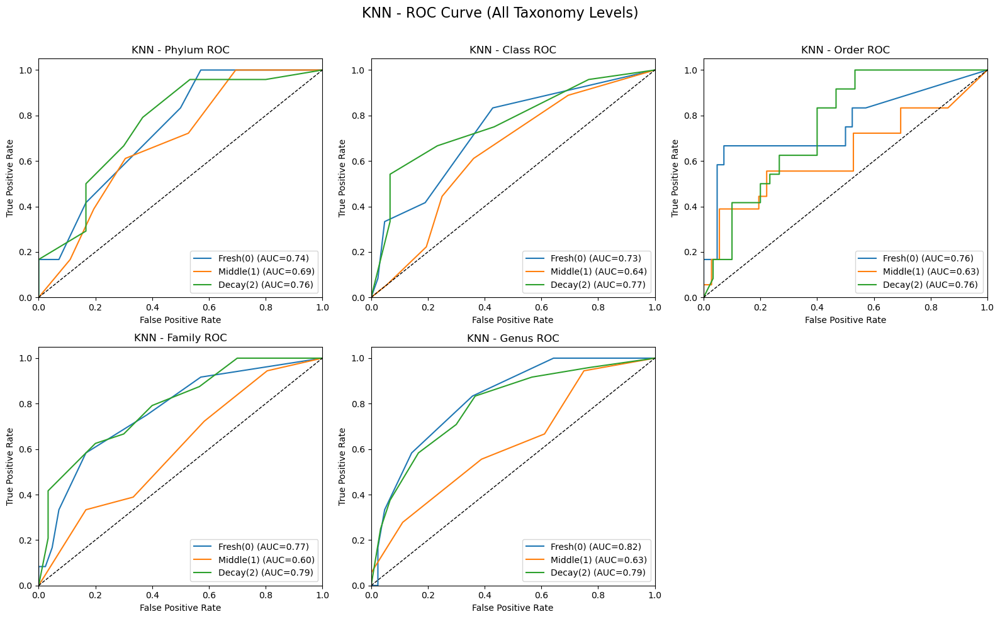

In [ ]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, roc_curve, auc
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, label_binarize
import matplotlib.pyplot as plt
import seaborn as sns

# TBARS 라벨링 함수 (임계값 반영)
def tbars_labeling(tbars_series):
    return np.where(
        tbars_series < 0.187, 0,
        np.where(tbars_series < 0.298, 1, 2)
    )  # 0: Fresh, 1: Middle, 2: Decay

# 모델 및 파라미터 그리드 정의 (기존과 동일)
model_configs = {
    "RandomForest": {
        "model": RandomForestClassifier,
        "params": {
            "n_estimators": [100, 200],
            "max_depth": [3, 5, 7],
            "min_samples_split": [2, 5]
        }
    },
    "XGBoost": {
        "model": XGBClassifier,
        "params": {
            "n_estimators": [100, 200],
            "max_depth": [3, 5, 7],
            "learning_rate": [0.05, 0.1]
        }
    },
    "SVC": {
        "model": lambda: Pipeline([
            ('scaler', StandardScaler()),
            ('svc', SVC(probability=True, class_weight="balanced"))
        ]),
        "params": {
            "svc__C": [0.5, 1, 2],
            "svc__gamma": ["scale", "auto"],
            "svc__kernel": ["rbf"]
        }
    },
    "LogisticRegression": {
        "model": lambda: Pipeline([
            ('scaler', StandardScaler()),
            ('lr', LogisticRegression())
        ]),
        "params": {
            "lr__penalty": ["elasticnet"],
            "lr__solver": ["saga"],
            "lr__l1_ratio": [0.2, 0.5, 0.8],
            "lr__C": [0.5, 1, 2],
            "lr__max_iter": [500],
            "lr__class_weight": ["balanced"],
            "lr__multi_class": ["multinomial"]
        }
    },
    "KNN": {
        "model": KNeighborsClassifier,
        "params": {
            "n_neighbors": [3, 5, 7],
            "weights": ["uniform", "distance"]
        }
    }
}

taxonomy_levels = ['Phylum', 'Class', 'Order', 'Family', 'Genus']

# TBARS 분류 모델 학습 (VIP>1.0 Feature만 사용)
all_model_results_tbars = {}

for level_name in taxonomy_levels:
    print(f"\n{'='*60}\n=== {level_name} Level 모델 학습 시작 (VIP>1.0 Feature, TBARS) ===\n{'='*60}")
    level_data = get_level_data(level_name)
    vip_features = vip_score_tbars[level_name]['Feature'].tolist()
    if not vip_features:
        print(f"{level_name}: VIP > 1.0 feature 없음, 스킵")
        continue
    X = level_data['features'][vip_features].values
    y = tbars_labeling(level_data['tbars'].values)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

    all_model_results_tbars[level_name] = {}

    for model_name, config in model_configs.items():
        print(f"\n--- {model_name} 학습 ---")
        model = config["model"]() if callable(config["model"]) else config["model"]()
        param_grid = config["params"]

        grid = GridSearchCV(model, param_grid, cv=3, scoring='accuracy', n_jobs=-1)
        grid.fit(X_train, y_train)

        best_model = grid.best_estimator_
        best_params = grid.best_params_

        y_train_pred = best_model.predict(X_train)
        y_test_pred = best_model.predict(X_test)

        train_acc = accuracy_score(y_train, y_train_pred)
        test_acc = accuracy_score(y_test, y_test_pred)
        train_f1 = f1_score(y_train, y_train_pred, average='macro')
        test_f1 = f1_score(y_test, y_test_pred, average='macro')
        overfit_acc = train_acc - test_acc
        overfit_f1 = train_f1 - test_f1

        all_model_results_tbars[level_name][model_name] = {
            "train_accuracy": train_acc,
            "test_accuracy": test_acc,
            "train_f1_score": train_f1,
            "test_f1_score": test_f1,
            "Overfitting_Acc": overfit_acc,
            "Overfitting_F1": overfit_f1,
            "Best_Params": best_params,
            "Best_Model": best_model,
            "GridSearchCV": grid,
            "X_test": X_test,
            "y_test": y_test
        }

        print(f"Train Acc: {train_acc:.3f}, Test Acc: {test_acc:.3f}")
        print(f"Train F1: {train_f1:.3f}, Test F1: {test_f1:.3f}")
        print(f"Overfitting Acc: {overfit_acc:.3f}, Overfitting F1: {overfit_f1:.3f}")
        print(f"Best Params: {best_params}")

print("\n=== 모든 모델 학습 및 평가 완료 ===")

# Confusion Matrix & ROC Curve (숫자 표기)
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

model_list = ["RandomForest", "XGBoost", "SVC", "LogisticRegression", "KNN"]
label_order = [0, 1, 2]  # Fresh(0), Middle(1), Decay(2)
label_names = ["Fresh(0)", "Middle(1)", "Decay(2)"]

for model in model_list:
    # 1. Confusion Matrix (3x2 subplot, 숫자 표기)
    fig_cm, axes_cm = plt.subplots(2, 3, figsize=(16, 10))
    axes_cm = axes_cm.flatten()
    for i, level in enumerate(taxonomy_levels):
        if level not in all_model_results_tbars or model not in all_model_results_tbars[level]:
            axes_cm[i].set_axis_off()
            continue
        best_model = all_model_results_tbars[level][model]["Best_Model"]
        X_test = all_model_results_tbars[level][model]["X_test"]
        y_test = all_model_results_tbars[level][model]["y_test"]
        y_pred = best_model.predict(X_test)
        cm = confusion_matrix(y_test, y_pred, labels=label_order)
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=axes_cm[i], cbar=False,
                    xticklabels=label_names, yticklabels=label_names, vmin=0)
        acc = accuracy_score(y_test, y_pred)
        f1m = f1_score(y_test, y_pred, average='macro')
        axes_cm[i].set_title(f"{model} - {level}\nAcc: {acc:.3f}, F1M: {f1m:.3f}")
        axes_cm[i].set_xlabel("Predicted Label")
        axes_cm[i].set_ylabel("True Label")
    axes_cm[5].axis('off')
    plt.suptitle(f"{model} - Confusion Matrix (All Taxonomy Levels)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

    # 2. ROC Curve (3x2 subplot, 숫자 표기)
    fig_roc, axes_roc = plt.subplots(2, 3, figsize=(16, 10))
    axes_roc = axes_roc.flatten()
    for i, level in enumerate(taxonomy_levels):
        if level not in all_model_results_tbars or model not in all_model_results_tbars[level]:
            axes_roc[i].set_axis_off()
            continue
        best_model = all_model_results_tbars[level][model]["Best_Model"]
        X_test = all_model_results_tbars[level][model]["X_test"]
        y_test = all_model_results_tbars[level][model]["y_test"]
        y_test_bin = label_binarize(y_test, classes=label_order)
        y_score = best_model.predict_proba(X_test) if hasattr(best_model, "predict_proba") else None
        ax = axes_roc[i]
        if y_score is not None:
            for j in range(3):
                fpr, tpr, _ = roc_curve(y_test_bin[:, j], y_score[:, j])
                roc_auc = auc(fpr, tpr)
                ax.plot(fpr, tpr, label=f"{label_names[j]} (AUC={roc_auc:.2f})")
            ax.plot([0, 1], [0, 1], 'k--', lw=1)
            ax.set_xlim([0.0, 1.0])
            ax.set_ylim([0.0, 1.05])
            ax.set_xlabel('False Positive Rate')
            ax.set_ylabel('True Positive Rate')
            ax.set_title(f"{model} - {level} ROC")
            ax.legend(loc="lower right")
        else:
            ax.text(0.5, 0.5, "No predict_proba", ha='center', va='center')
            ax.set_axis_off()
    axes_roc[5].axis('off')
    plt.suptitle(f"{model} - ROC Curve (All Taxonomy Levels)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

## TBARS

In [ ]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

print("=== TBARS 회귀 모델 학습 (Fresh + Middle 샘플만 사용) ===")

# Genus level 데이터 준비 (Fresh와 Middle만 사용)
level_name = 'Genus'
level_data = get_level_data(level_name)
vip_features = vip_score_tbars[level_name]['Feature'].tolist()

if not vip_features:
    print("VIP > 1.0 feature 없음")
else:
    # TBARS 라벨링
    y_labels = tbars_labeling(level_data['tbars'].values)
    
    # Fresh(0)과 Middle(1)만 선택
    fresh_middle_mask = (y_labels == 0) | (y_labels == 1)
    
    X = level_data['features'][vip_features].iloc[fresh_middle_mask].values
    y = level_data['tbars'].iloc[fresh_middle_mask].values
    
    print(f"Fresh + Middle 샘플 수: {len(X)}")
    print(f"TBARS 범위: {y.min():.3f} ~ {y.max():.3f}")
    print(f"사용 Feature 수: {len(vip_features)}")
    
    # Train/Test Split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # 모델 및 파라미터 정의
    model_configs = {
        "LightGBM": {
            "model": LGBMRegressor,
            "params": {
                "n_estimators": [100, 200],
                "max_depth": [3, 5, 7],
                "learning_rate": [0.05, 0.1, 0.2],
                "num_leaves": [20, 31, 50],
                "random_state": [42]
            }
        },
        "RandomForest": {
            "model": RandomForestRegressor,
            "params": {
                "n_estimators": [100, 200],
                "max_depth": [3, 5, 7, None],
                "min_samples_split": [2, 5],
                "random_state": [42]
            }
        },
        "XGBoost": {
            "model": XGBRegressor,
            "params": {
                "n_estimators": [100, 200],
                "max_depth": [3, 5, 7],
                "learning_rate": [0.05, 0.1, 0.2],
                "random_state": [42]
            }
        },
        "SVR": {
            "model": lambda: Pipeline([
                ('scaler', StandardScaler()),
                ('svr', SVR())
            ]),
            "params": {
                "svr__C": [0.1, 1, 10],
                "svr__gamma": ["scale", "auto"],
                "svr__kernel": ["rbf", "linear"]
            }
        }
    }

    # 성능 평가 함수
    def calculate_rsd(y_true, y_pred):
        """RSD (Relative Standard Deviation) 계산"""
        rmse = np.sqrt(mean_squared_error(y_true, y_pred))
        mean_true = np.mean(y_true)
        return (rmse / mean_true) * 100

    # 모델 학습 및 평가
    regression_results_tbars = {}

    for model_name, config in model_configs.items():
        print(f"\n--- {model_name} 학습 중 ---")
        
        model = config["model"]() if callable(config["model"]) else config["model"]()
        param_grid = config["params"]
        
        # GridSearchCV
        grid = GridSearchCV(
            model, param_grid, 
            cv=5, scoring='neg_mean_absolute_error', 
            n_jobs=-1, verbose=0
        )
        grid.fit(X_train, y_train)
        
        best_model = grid.best_estimator_
        best_params = grid.best_params_
        
        # 예측
        y_train_pred = best_model.predict(X_train)
        y_test_pred = best_model.predict(X_test)
        
        # 성능 지표 계산
        train_mae = mean_absolute_error(y_train, y_train_pred)
        test_mae = mean_absolute_error(y_test, y_test_pred)
        train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
        test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
        train_r2 = r2_score(y_train, y_train_pred)
        test_r2 = r2_score(y_test, y_test_pred)
        train_rsd = calculate_rsd(y_train, y_train_pred)
        test_rsd = calculate_rsd(y_test, y_test_pred)
        
        # Cross Validation
        cv_mae_scores = -cross_val_score(best_model, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
        cv_rmse_scores = np.sqrt(-cross_val_score(best_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error'))
        cv_r2_scores = cross_val_score(best_model, X_train, y_train, cv=5, scoring='r2')
        
        cv_mae_mean = np.mean(cv_mae_scores)
        cv_rmse_mean = np.mean(cv_rmse_scores)
        cv_r2_mean = np.mean(cv_r2_scores)
        
        overfit_r2 = train_r2 - test_r2
        
        # 결과 저장
        regression_results_tbars[model_name] = {
            "Train_MAE": train_mae,
            "Test_MAE": test_mae,
            "Train_RMSE": train_rmse,
            "Test_RMSE": test_rmse,
            "Train_R2": train_r2,
            "Test_R2": test_r2,
            "Train_RSD": train_rsd,
            "Test_RSD": test_rsd,
            "CV_MAE_Mean": cv_mae_mean,
            "CV_RMSE_Mean": cv_rmse_mean,
            "CV_R2_Mean": cv_r2_mean,
            "Overfit_R2": overfit_r2,
            "Best_Params": best_params,
            "Best_Model": best_model,
            "y_train_pred": y_train_pred,
            "y_test_pred": y_test_pred,
            "X_train": X_train,
            "X_test": X_test,
            "y_train": y_train,
            "y_test": y_test
        }
        
        print(f"Test MAE: {test_mae:.4f}, Test RMSE: {test_rmse:.4f}, Test R²: {test_r2:.3f}")
        print(f"CV R² Mean: {cv_r2_mean:.3f}, Overfit R²: {overfit_r2:.3f}")

    print("\n=== TBARS 회귀 모델 학습 완료 ===")

=== TBARS 회귀 모델 학습 (Fresh + Middle 샘플만 사용) ===
Fresh + Middle 샘플 수: 152
TBARS 범위: 0.100 ~ 0.295
사용 Feature 수: 47

--- LightGBM 학습 중 ---
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048337 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1564
[LightGBM] [Info] Number of data points in the train set: 97, number of used features: 47
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.058985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1553
[LightGBM] [Info] Start training from score 0.203608
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041876 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1572
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 47
[LightGBM] [Info] Auto-choosing col-wise mu

In [ ]:
import os
import pandas as pd

# 결과 디렉토리 생성
result_dir = "model_result"
os.makedirs(result_dir, exist_ok=True)

# 결과 DataFrame 생성
result_rows_tbars = []
for model_name, results in regression_results_tbars.items():
    row = {
        "Model": model_name,
        "Train_MAE": results["Train_MAE"],
        "Test_MAE": results["Test_MAE"],
        "Train_RMSE": results["Train_RMSE"],
        "Test_RMSE": results["Test_RMSE"],
        "Train_R2": results["Train_R2"],
        "Test_R2": results["Test_R2"],
        "Train_RSD": results["Train_RSD"],
        "Test_RSD": results["Test_RSD"],
        "CV_MAE_Mean": results["CV_MAE_Mean"],
        "CV_RMSE_Mean": results["CV_RMSE_Mean"],
        "CV_R2_Mean": results["CV_R2_Mean"],
        "Overfit_R2": results["Overfit_R2"],
        "Best_Params": str(results["Best_Params"])
    }
    result_rows_tbars.append(row)

# DataFrame 생성 및 정렬
df_regression_tbars = pd.DataFrame(result_rows_tbars)
df_regression_tbars = df_regression_tbars.sort_values("Test_R2", ascending=False).reset_index(drop=True)

# 엑셀 파일로 저장
excel_path = os.path.join(result_dir, "clr_optuna_vip_tbars.xlsx")
df_regression_tbars.to_excel(excel_path, index=False)

print(f"TBARS 회귀 모델 결과가 '{excel_path}'에 저장되었습니다.")
print("\n=== 결과 요약 ===")
print(df_regression_tbars[['Model', 'Test_MAE', 'Test_RMSE', 'Test_R2', 'CV_R2_Mean', 'Overfit_R2']].to_string(index=False))

TBARS 회귀 모델 결과가 'model_result/clr_optuna_vip_tbars.xlsx'에 저장되었습니다.

=== 결과 요약 ===
       Model  Test_MAE  Test_RMSE   Test_R2  CV_R2_Mean  Overfit_R2
    LightGBM  0.030761   0.038130  0.401025    0.160008    0.372260
     XGBoost  0.033077   0.041559  0.288445    0.029519    0.677872
RandomForest  0.034312   0.041622  0.286310    0.157982    0.505413
         SVR  0.040403   0.049316 -0.001953   -0.019680   -0.014383


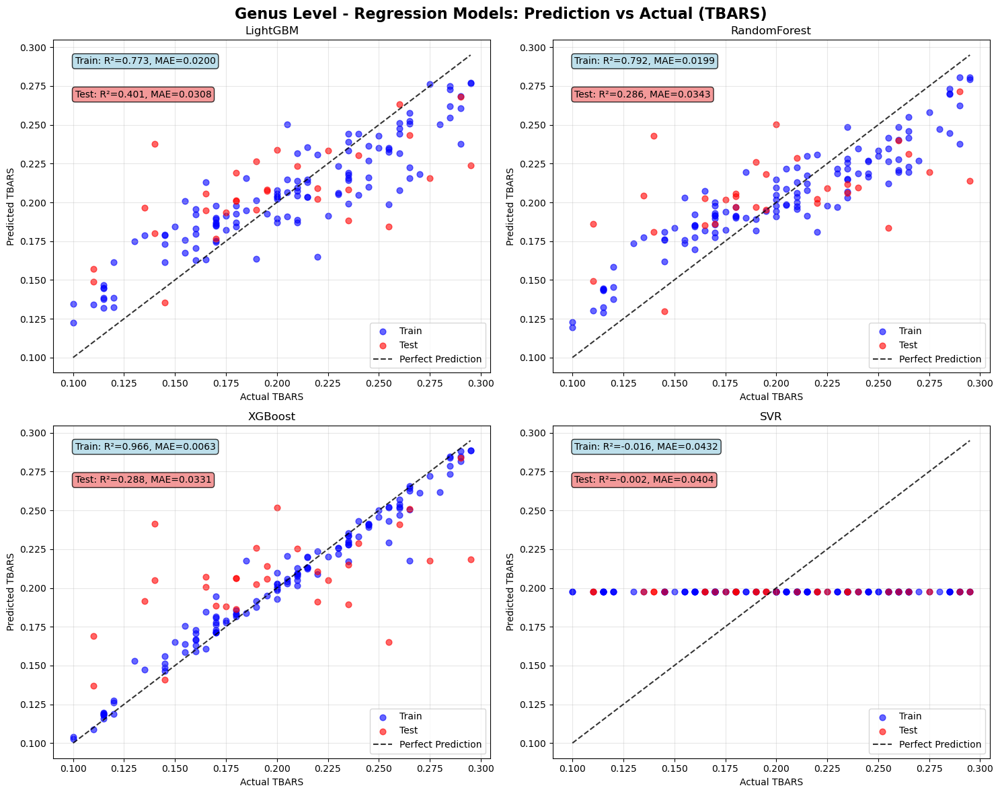

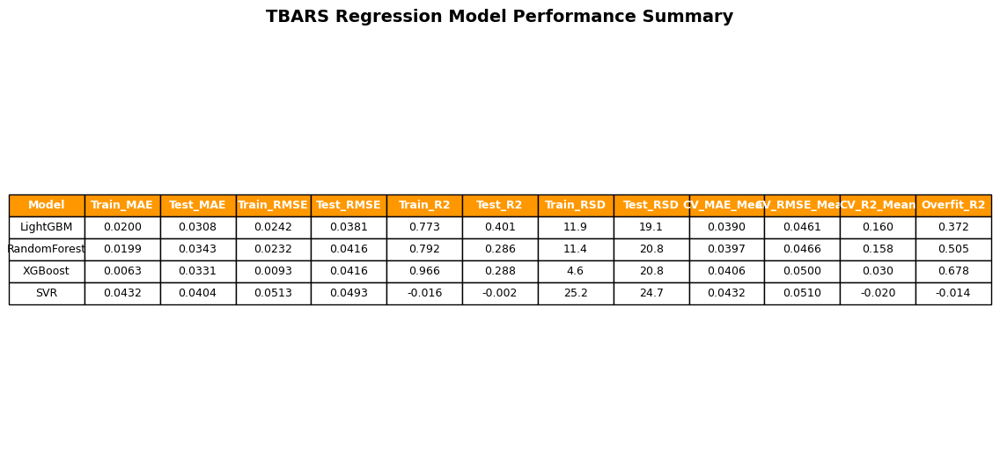

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Prediction vs Actual 시각화
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.flatten()

model_names = list(regression_results_tbars.keys())
colors = {'Train': 'blue', 'Test': 'red'}

for idx, model_name in enumerate(model_names):
    results = regression_results_tbars[model_name]
    ax = axes[idx]
    
    # Train 데이터
    ax.scatter(results['y_train'], results['y_train_pred'], 
               alpha=0.6, color=colors['Train'], label='Train', s=40)
    
    # Test 데이터
    ax.scatter(results['y_test'], results['y_test_pred'], 
               alpha=0.6, color=colors['Test'], label='Test', s=40)
    
    # Perfect prediction line
    min_val = min(np.min(results['y_train']), np.min(results['y_test']))
    max_val = max(np.max(results['y_train']), np.max(results['y_test']))
    ax.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.8, label='Perfect Prediction')
    
    # 성능 지표 표시
    train_r2 = results['Train_R2']
    test_r2 = results['Test_R2']
    train_mae = results['Train_MAE']
    test_mae = results['Test_MAE']
    
    ax.text(0.05, 0.95, f'Train: R²={train_r2:.3f}, MAE={train_mae:.4f}', 
            transform=ax.transAxes, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
    ax.text(0.05, 0.85, f'Test: R²={test_r2:.3f}, MAE={test_mae:.4f}', 
            transform=ax.transAxes, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.8))
    
    ax.set_xlabel('Actual TBARS')
    ax.set_ylabel('Predicted TBARS')
    ax.set_title(f'{model_name}')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.suptitle('Genus Level - Regression Models: Prediction vs Actual (TBARS)', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# 성능 지표 요약 테이블 시각화
fig, ax = plt.subplots(figsize=(12, 6))
ax.axis('tight')
ax.axis('off')

# 테이블 데이터 준비
table_data = []
for model_name in model_names:
    results = regression_results_tbars[model_name]
    table_data.append([
        model_name,
        f"{results['Train_MAE']:.4f}",
        f"{results['Test_MAE']:.4f}",
        f"{results['Train_RMSE']:.4f}",
        f"{results['Test_RMSE']:.4f}",
        f"{results['Train_R2']:.3f}",
        f"{results['Test_R2']:.3f}",
        f"{results['Train_RSD']:.1f}",
        f"{results['Test_RSD']:.1f}",
        f"{results['CV_MAE_Mean']:.4f}",
        f"{results['CV_RMSE_Mean']:.4f}",
        f"{results['CV_R2_Mean']:.3f}",
        f"{results['Overfit_R2']:.3f}"
    ])

headers = ['Model', 'Train_MAE', 'Test_MAE', 'Train_RMSE', 'Test_RMSE', 
           'Train_R2', 'Test_R2', 'Train_RSD', 'Test_RSD', 
           'CV_MAE_Mean', 'CV_RMSE_Mean', 'CV_R2_Mean', 'Overfit_R2']

table = ax.table(cellText=table_data, colLabels=headers, 
                cellLoc='center', loc='center', fontsize=10)
table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1.2, 1.5)

# 헤더 스타일링
for i in range(len(headers)):
    table[(0, i)].set_facecolor('#FF9800')
    table[(0, i)].set_text_props(weight='bold', color='white')

plt.title('TBARS Regression Model Performance Summary', fontsize=14, fontweight='bold', pad=20)
plt.show()